In [153]:
import matplotlib.pyplot as plt

import numpy as np

from astropy import constants as cst
from astropy import units as u
import healpy as hp

from aqn import *
from constants import *

In [154]:
# define AQN parameters
m_aqn_kg = 0.01*u.kg
R_aqn_cm = calc_R_AQN(m_aqn_kg)

print("using m_aqn =", m_aqn_kg)
print("using R_aqn =", R_aqn_cm)

using m_aqn = 0.01 kg
using R_aqn = 1.8964778823564563e-05 cm


In [155]:
# define bandwidth

################ GALEX #########################################
wavel_min = 1350 * u.Angstrom
wavel_max = 1750 * u.Angstrom
f_max_hz = (cst.c.cgs / wavel_min.to(u.cm)).to(u.Hz)
f_min_hz = (cst.c.cgs / wavel_max.to(u.cm)).to(u.Hz)
skymap_units =  1*u.photon / u.cm**2 / u.s / u.Angstrom

################ WMAP K-Band ###################################
# Source: https://lambda.gsfc.nasa.gov/product/wmap/current/
f_centre_GHz = 23 * u.GHz
f_min_hz = (f_centre_GHz - 5.5/2 * u.GHz).to(u.Hz)
f_max_hz = (f_centre_GHz + 5.5/2 * u.GHz).to(u.Hz)

#print("wavelength range:", wavel_min, "---", wavel_max)
print("frequency  range:", f_min_hz, "---", f_max_hz)


skymap_units = u.Jy
# conversion array from erg/s/Hz/cm2 to photons/s/A/cm2
def convert_to_skymap_units(F_erg_hz_cm2,nu):
    erg_hz_cm2 = 1*u.erg/u.s/u.Hz/u.cm**2
    w = nu.to(u.AA, equivalencies=u.spectral())
    C = (erg_hz_cm2).to(skymap_units, u.spectral_density(w)) / erg_hz_cm2 * 2*np.pi
    #                                                                      ^^^^^^^ this comes from using hbar instead of h in the conversion.
    return F_erg_hz_cm2 * C

def convert_to_skymap_units(F_erg_hz_cm2,nu):
    erg_hz_cm2 = 1*u.erg/u.s/u.Hz/u.cm**2
    C = erg_hz_cm2.to(skymap_units)
    return F_erg_hz_cm2 * C / erg_hz_cm2
#################################################################

frequency  range: 20250000000.0 Hz --- 25750000000.0 Hz


In [156]:
def create_skymap2(signal, signal_unit, log_signal):
    f1 = plt.figure(figsize=(7.5,4.5), dpi=700)
    # rotation in (lat, long, psi)
    if log_signal:
        hp.mollview(np.log10(signal.value), 
                    title="FUV Emissions from AQN Annihilation", 
                    rot=(0,0,0),
                    cmap='gist_rainbow', 
                    fig=f1, 
                    unit="")
    else:
        hp.mollview(signal.value, 
                    title="FUV Emissions from AQN Annihilation", 
                    rot=(0,0,0),
                    cmap='gist_rainbow', 
                    fig=f1, 
                    unit="")    
    #hp.graticule(dmer=360,dpar=360,alpha=0)  
    hp.graticule(dmer=30,dpar=30, alpha=1, color="white", linewidth=10)
    longitude_labels = [150,120,90,60,30,0,330,300,270,240,210]
    for i in range(len(longitude_labels)):
        plt.text((-5+i)*0.34,0.1,str(longitude_labels[i])+"$^\circ$",size=7,horizontalalignment="center")

    latitude_labels = [-60,-30,0,30,60]
    plt.text(-2.01,-0.41,"-30$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-2.1,0,"0$^\circ$",size=7,horizontalalignment="center")
    plt.text(-2,0.39,"30$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-1.5,0.73,"60$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-1.51,-0.8,"-60$^\circ$",size=7,horizontalalignment="center") 
    if log_signal:
        plt.text(0,-1.10,"Logarithmic",size=9,horizontalalignment="center")
    #plt.text(0,-1.37,"photons$\,\cdot\,$cm$^{-2}\cdot$A$^{-1}\cdot$s$^{-1}\cdot$sr$^{-1}$",size=10,horizontalalignment="center")
    plt.text(0,-1.37,signal_unit,size=10,horizontalalignment="center")
    #plt.savefig("BURKERT & CONST VM 5eV.png")
    plt.show()
    

    
def create_skymap(signal):
    f1 = plt.figure(figsize=(7.5,4.5), dpi=700)
    # rotation in (lat, long, psi)
    hp.mollview(np.log10(signal.value), 
                title="FUV Emissions from AQN Annihilation", 
                rot=(0,0,0),
                cmap='gist_rainbow', 
                fig=f1, 
                unit="")

    #hp.graticule(dmer=360,dpar=360,alpha=0)  
    hp.graticule(dmer=30,dpar=30, alpha=1, color="white", linewidth=10)
    longitude_labels = [150,120,90,60,30,0,330,300,270,240,210]
    for i in range(len(longitude_labels)):
        plt.text((-5+i)*0.34,0.1,str(longitude_labels[i])+"$^\circ$",size=7,horizontalalignment="center")

    latitude_labels = [-60,-30,0,30,60]
    plt.text(-2.01,-0.41,"-30$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-2.1,0,"0$^\circ$",size=7,horizontalalignment="center")
    plt.text(-2,0.39,"30$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-1.5,0.73,"60$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-1.51,-0.8,"-60$^\circ$",size=7,horizontalalignment="center") 

    plt.text(0,-1.10,"Logarithmic",size=9,horizontalalignment="center")
    #plt.text(0,-1.37,"photons$\,\cdot\,$cm$^{-2}\cdot$A$^{-1}\cdot$s$^{-1}\cdot$sr$^{-1}$",size=10,horizontalalignment="center")
    plt.text(0,-1.37,"Jy/sr",size=10,horizontalalignment="center")
    #plt.savefig("BURKERT & CONST VM 5eV.png")
    plt.show()
    
def create_skymap_T_aqn(signal, disp_text):
    f1 = plt.figure(figsize=(7.5,4.5), dpi=700)
    # rotation in (lat, long, psi)
    hp.mollview(signal.value, 
                title="$T_{AQN}$, "+str(disp_text), 
                rot=(0,0,0),
                cmap='gist_rainbow', 
                fig=f1, 
                unit="")

    #hp.graticule(dmer=360,dpar=360,alpha=0)  
    hp.graticule(dmer=30,dpar=30, alpha=1, color="white", linewidth=10)
    longitude_labels = [150,120,90,60,30,0,330,300,270,240,210]
    for i in range(len(longitude_labels)):
        plt.text((-5+i)*0.34,0.1,str(longitude_labels[i])+"$^\circ$",size=7,horizontalalignment="center")

    latitude_labels = [-60,-30,0,30,60]
    plt.text(-2.01,-0.41,"-30$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-2.1,0,"0$^\circ$",size=7,horizontalalignment="center")
    plt.text(-2,0.39,"30$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-1.5,0.73,"60$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-1.51,-0.8,"-60$^\circ$",size=7,horizontalalignment="center") 

    #plt.text(0,-1.10,"",size=9,horizontalalignment="center")
    plt.text(0,-1.37,"eV",size=10,horizontalalignment="center")

    #plt.savefig("BURKERT & CONST VM 5eV.png")
    plt.show()

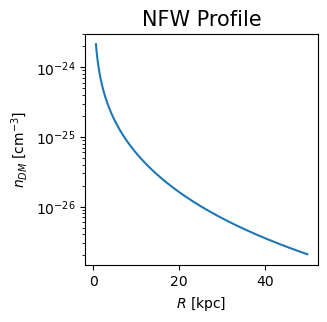

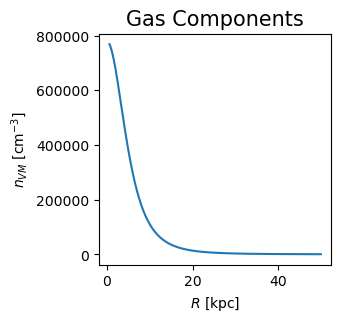

NSIDE is 32
NPIX is 12288
dOmega is 0.0010226538585904274
done


In [235]:
sun_mw_distance_kpc = 8*u.kpc

dm_model = "NFW Profile"
vm_model = "Gas Components"
l_min = 0.6
l_max = 50
dl =0.5*u.kpc
NSIDE = 2**5
disp = True
ionized_gas = True

# ########### NFW Profile #############################################
if dm_model == "NFW Profile":
    rho_0h = 0.0106 * u.solMass / u.pc**3
    r_h = 19.0 * u.kpc

    def rho_halo(R_kpc):
        return rho_0h.to(u.kg/u.m**3) / ((R_kpc/r_h)*(1+R_kpc/r_h)**2)

    def n_halo(R_none):
        return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
# #####################################################################

# # ########### constant density #########################################
if dm_model == "Constant DM density":
    n_aqn_const_cm3 = 0.3/1e25 * u.cm**-3
    def n_halo(R_none):
        return np.ones(np.shape(R_none)) * n_aqn_const_cm3
# # ######################################################################

########### Burkert Profile #########################################
if dm_model == "Burkert Profile":
    vh = 414 * u.km / u.s
    r0 = 7.8 * u.kpc
    rho0 = (vh**2 / (4*np.pi * r0**2 * cst.G)).to(u.kg/u.m**3)

    def rho_halo(R_kpc):
        return rho0 * r0**3 / ( (R_kpc+r0)*((R_kpc)**2 + r0**2) )

    def n_halo(R_none):
        return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
#####################################################################

if disp:
    plt.figure(dpi=100,figsize=(3,3))
    plt.plot(np.arange(l_min,l_max,0.1), n_halo(np.arange(l_min,l_max,0.1)))
    plt.xlabel("$R$ [kpc]")
    plt.ylabel("$n_{DM}$ [cm$^{-3}$]")
    plt.yscale("log")
    plt.title(dm_model, size=15)
    #plt.savefig(dm_model_name+".png", bbox_inches='tight')
    plt.show()

########################################################################


############# constant density ######################################### 
if vm_model == "Constant VM density":
    n_cold_cm3 = 1.0e-1 * u.cm**-3
    def n_vm(R_none):
        return np.ones(np.shape(R_none)) * n_cold_cm3
########################################################################

############# gas components ######################################### 
if vm_model == "Gas Components":
    [a1_c, b1_c, c1_c, 
     a2_c, b2_c, c2_c, 
     a3_c, b3_c, c3_c, 
     a4_c, b4_c, c4_c, 
     a5_c, b5_c, c5_c, 
     a6_c, b6_c, c6_c] = [30.04649796,  0.4079755,  3.77607598,  
                  1e3,3e-1,15,
                 2.6e4,5e-2,3,
                 0,0,0,
                 0,0,0,
                 0,0,0,]

    [a1_w, b1_w, c1_w, 
     a2_w, b2_w, c2_w, 
     a3_w, b3_w, c3_w, 
     a4_w, b4_w, c4_w, 
     a5_w, b5_w, c5_w, 
     a6_w, b6_w, c6_w] = [1.1e0,1e-1,0.22,
                  1.7e1,12e-1,110,
                  0.575e4,8.2e-2,13.7,
                 0,0,0,
                 0,0,0,
                 0,0,0,]

    [a1_wh, b1_wh, c1_wh, 
     a2_wh, b2_wh, c2_wh, 
     a3_wh, b3_wh, c3_wh, 
     a4_wh, b4_wh, c4_wh, 
     a5_wh, b5_wh, c5_wh, 
     a6_wh, b6_wh, c6_wh] = [6.1e1,4.4e-1,1.8,
                  9e2,9.2e-2,2.8,
                  1.5e4,7e-2,9,
                 0,0,0,
                 0,0,0,
                 0,0,0,]

    [a1_h, b1_h, c1_h, 
     a2_h, b2_h, c2_h, 
     a3_h, b3_h, c3_h, 
     a4_h, b4_h, c4_h, 
     a5_h, b5_h, c5_h, 
     a6_h, b6_h, c6_h] = [2e2,4e-1,9.5,
                  1e4,10e-2,6,
                  2.6e4,3e-2,3.1,
                  0,0,0,
                  0,0,0,
                  0,0,0,]

    from astropy.cosmology import WMAP7             # WMAP 7-year cosmology
    rho_crit_z05_cgs = WMAP7.critical_density(0.5)  # critical density at z = 0.5  
    rho_crit_z05_si = rho_crit_z05_cgs.to(u.kg / u.m**3)
    r_vir_kpc = 233 * u.kpc

    def rho_gas_component(R_kpc,gas_component):
        x = (R_kpc/r_vir_kpc).value
        if gas_component == "cold":
            return  (a1_c / (1+(x/b1_c)**2)**c1_c + \
                     a2_c / (1+(x/b2_c)**2)**c2_c + \
                     a3_c / (1+(x/b3_c)**2)**c3_c) * rho_crit_z05_si
        if gas_component == "warm":
            return  (a1_w / (1+(x/b1_w)**2)**c1_w + \
                     a2_w / (1+(x/b2_w)**2)**c2_w + \
                     a3_w / (1+(x/b3_w)**2)**c3_w) * rho_crit_z05_si
        if gas_component == "warm-hot":
            return  (a1_wh / (1+(x/b1_wh)**2)**c1_wh + \
                     a2_wh / (1+(x/b2_wh)**2)**c2_wh + \
                     a3_wh / (1+(x/b3_wh)**2)**c3_wh) * rho_crit_z05_si 
        if gas_component == "hot":
            return  (a1_h / (1+(x/b1_h)**2)**c1_h + \
                     a2_h / (1+(x/b2_h)**2)**c2_h + \
                     a3_h / (1+(x/b3_h)**2)**c3_h) * rho_crit_z05_si 

    def n_gas_component(R_none, gas_component):
        return rho_gas_component(R_none*u.kpc, gas_component) / cst.m_p.si


    def rho_gas(R_none):
        return rho_gas_component(R_none,"cold") + rho_gas_component(R_none,"warm") + rho_gas_component(R_none,"warm-hot") + rho_gas_component(R_none,"hot")

    def n_vm(R_none):
        return rho_gas(R_none) / cst.m_p.si

    ionized_gas = True
########################################################################

if disp:
    plt.figure(dpi=100,figsize=(3,3))
    plt.plot(np.arange(l_min,l_max,0.1), n_vm(np.arange(l_min,l_max,0.1)))
    plt.xlabel("$R$ [kpc]")
    plt.ylabel("$n_{VM}$ [cm$^{-3}$]")
    #plt.yscale("log")
    plt.title(vm_model, size=15)
    #plt.savefig(dm_model_name+".png", bbox_inches='tight')
    plt.show()

########################################################################



# some resolution parameters
print("NSIDE is", NSIDE)
#NSIDE = 2**6
wavelength_band_resolution = 30
#frequency_band_resolution = 0.5e14

frequency_band_resolution = 1e9


NPIX = hp.nside2npix(NSIDE)
print("NPIX is", NPIX)
dOmega = hp.nside2pixarea(nside=NSIDE)
print("dOmega is", dOmega)
remove_low_lat = False

# array of theta, phi, for each pixel
theta, phi = hp.pix2ang(nside = NSIDE, ipix = list(range(NPIX)))
low_lat_filter = (np.degrees(theta) > 73) & (np.degrees(theta) < 113)
high_lat_filter = (np.degrees(theta) < 73) | (np.degrees(theta) > 113)

# frequency band
frequency_band = np.arange(f_min_hz.value, f_max_hz.value, frequency_band_resolution) * u.Hz

#print("using NSIDE of:", NSIDE)
#print("     dOmega is:", dOmega)





# sightline elements
l_min_kpc = l_min*u.kpc
l_max_kpc = l_max*u.kpc
l_list = np.arange(l_min_kpc.value,l_max_kpc.value,dl.value)[:, np.newaxis]

# 2D array of distance elements along each sightline, sun-centric
l_array = np.ones((len(l_list),len(theta))) * l_list
if remove_low_lat:             # number of pixels
    l_array[:,low_lat_filter] = 0

# 2D array of distance elements along each sightline, galaxy-centric
x = l_array * np.sin(theta) * np.cos(phi) - sun_mw_distance_kpc.value
y = l_array * np.sin(theta) * np.sin(phi)
z = l_array * np.cos(theta)
R_array = np.sqrt(x**2 + y**2 + z**2)

# calculate AQN number density
n_aqn_cm3 = n_halo(R_array)

h_func_cutoff = 17 + 12*np.log(2)
def h(x):
    return_array = np.copy(x)
    return_array[np.where(x<1)] = (17 - 12*np.log(x[np.where(x<1)]/2))
    return_array[np.where(x>=1)] = h_func_cutoff
    return return_array

if not ionized_gas:


    # calculate VM number density
    n_vm_cm3 = n_vm(R_array) 

    # calculate AQN temperature
    def T_AQN_neutral(n_bar, Dv, f, g):
        return (3/32 * np.pi * (1-g) * f * Dv * 1/(cst.alpha**(5/2)) * m_p_erg * (m_e_erg)**(1/4) * 
                ((n_bar).to(1/u.cm**3) * invcm_to_erg**3))**(4/17) * erg_to_eV



    # erg Hz^-1 s^-1 cm^-2
    # nu Hz
    # T eV
    def spectral_surface_emissivity_cgs(nu, T):
        T_K = T * eV_to_K
        k_B_cgs = cst.k_B.cgs
        h_cgs = cst.h.cgs

        return  (1/u.Hz)*(1/cst.hbar.cgs * 1/cst.c.cgs)**2 * 4/45 * (k_B_cgs * T_K)**3 * cst.alpha ** (5/2) * 1/np.pi * ((k_B_cgs * T_K)/(m_e_eV*eV_to_erg))**(1/4) * (1 + (h_cgs * nu)/(k_B_cgs * T_K)) * np.exp(- (h_cgs * nu)/(k_B_cgs * T_K)) * h((h_cgs * nu)/(k_B_cgs * T_K))/u.s


    T_aqn_ev = T_AQN_neutral(n_vm_cm3, Dv, f, g)

    if disp:
        plt.figure(dpi=100,figsize=(3,3))
        plt.plot(l_list,T_aqn_ev[:,500], ".")
        plt.xlabel("$L$ [kpc]")
        plt.ylabel("$T_AQN$ [eV]")
        plt.show()


    # integrate along the bandwidth
    # calculate spectral spatial emissivity
    dFdw_erg_hz_cm2 = np.zeros(np.shape(T_aqn_ev)) * skymap_units #u.erg/u.cm**2/u.s/u.Hz
    for nu in frequency_band:
        #print(nu)
        dFdw_erg_hz_cm2 += convert_to_skymap_units(spectral_surface_emissivity_cgs(nu, T_aqn_ev), nu)

    if disp:
        plt.figure(dpi=100,figsize=(3,3))
        plt.plot(l_list,dFdw_erg_hz_cm2[:,500], ".")
        plt.xlabel("$L$ [kpc]")
        plt.ylabel("Surface Emissiv. ["+str(dFdw_erg_hz_cm2.unit)+"]")
        plt.show()


    # calculate spectral spatial emissivity
    dFdomega_erg_hz_cm3 = dFdw_erg_hz_cm2  * R_aqn_cm**2 * n_aqn_cm3.to(1/u.cm**3) #*4*np.pi

    if disp:
        plt.figure(dpi=100,figsize=(3,3))
        plt.plot(l_list,dFdomega_erg_hz_cm3[:,500], ".")
        plt.xlabel("$L$ [kpc]")
        plt.ylabel("Spatial Emissiv. ["+str(dFdomega_erg_hz_cm3.unit)+"]")
        plt.show()

    # integrate along sightline
    F_tot_erg_hz_cm2 = np.sum(dFdomega_erg_hz_cm3,0) /(4*np.pi*u.sr) * dl.cgs * dOmega ##############
    if remove_low_lat:
        F_tot_erg_hz_cm2[low_lat_filter] = 0
    #F_tot_erg_hz_cm2[low_lat_filter] = 0

else:
    # calculate mass densities of each gas component
    n_cold     = n_gas_component(R_array, "cold") 

    n_warm     = n_gas_component(R_array, "warm") # avoid setting variables
    T_warm     = (3e4 + 1e5)/2 * u.K * K_to_eV

    n_warm_hot = n_gas_component(R_array, "warm-hot")
    T_warm_hot = (1e5 + 1e6)/2 * u.K * K_to_eV

    n_hot      = n_gas_component(R_array, "hot")
    T_hot      = 1e6 * u.K * K_to_eV



    spectral_surface_emissivity_u_factor = (1 / cst.hbar.cgs) * (1/(cst.hbar.cgs * cst.c.cgs))**2 * (cst.hbar.cgs * 1/u.Hz * 1/u.s)
    
    def spectral_surface_emissivity(T, frequency_band):
        res = np.zeros(np.shape(T)) * u.mK #* skymap_units / u.sr # u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr# # 
        res[T<0] = -1 * u.mK #* skymap_units / u.sr # u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr 
        f = frequency_band[0]
        T = T * eV_to_erg
        for i in range(len(frequency_band)):
            w_div_T = (2*np.pi*Hz_to_erg)*frequency_band[i] / T
            res_new = spectral_surface_emissivity_u_factor * 4/45 * \
                        T[T>0]**3 * cst.alpha ** (5/2) * 1/np.pi * \
                       (T[T>0]/(m_e_eV*eV_to_erg))**(1/4) * \
                       (1 + w_div_T[T>0]) * np.exp(- w_div_T[T>0]) * h(w_div_T[T>0]) * 1/(dOmega*u.sr)
            res_new = convert_to_skymap_units(res_new, frequency_band[i]).to(u.mK, equivalencies = u.brightness_temperature(frequency_band[i]))
            res[T>0] += res_new #* conversion_array[i] 
        return res 


    def spectral_spatial_emissivity_cold(n_AQN, n_bar, Dv, f, g, frequency_band):
        T_AQN = T_AQN_analytical(n_cold, Dv, f, g)
        dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
        return dFdw 

    def spectral_spatial_emissivity_hot(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
        T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
        T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
        T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
        ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
        T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
        dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
        #dF = np.sum(dFdw,2)
        return dFdw
    
    def calc_T_aqn(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
        T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
        T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
        T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
        ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
        T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
        dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
        #dF = np.sum(dFdw,2)
        return T_AQN

    def func(n_c, n_w, n_wh,n_h, frequency_band):
        #print(spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band).unit)
        epsilon = (spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band) +
                   spectral_spatial_emissivity_hot( n_aqn_cm3, n_w,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band) +
                   spectral_spatial_emissivity_hot( n_aqn_cm3, n_wh, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band) +
                   spectral_spatial_emissivity_hot( n_aqn_cm3, n_h,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band))* \
            4 * np.pi * R_aqn_cm**2 * n_aqn_cm3.to(1/u.cm**3)
        return epsilon #.value
    
    F_tot_galex = sum(func(n_cold,n_warm,n_warm_hot,n_hot, frequency_band)) / (4*np.pi) * (dl.cgs) * dOmega

    T_aqn_cold_ev     = T_AQN_analytical(n_cold, Dv, f, g)
    T_aqn_warm_ev     = calc_T_aqn( n_aqn_cm3, n_warm,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band)
    T_aqn_warm_hot_ev = calc_T_aqn( n_aqn_cm3, n_warm_hot, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band)
    T_aqn_hot_ev      = calc_T_aqn( n_aqn_cm3, n_hot,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band)
    
    T_aqn_dict_ev = {"cold":     T_aqn_cold_ev, 
                     "warm":     T_aqn_warm_ev,
                     "warm_hot": T_aqn_warm_hot_ev,
                     "hot":      T_aqn_hot_ev}
    
    spectral_spatial_emissivity = func(n_cold,n_warm,n_warm_hot,n_hot, frequency_band)
    #print(np.shape(func(n_cold,n_warm,n_warm_hot,n_hot, frequency_band)))
#F_tot_erg_hz_cm2 = calc_F_tot("NFW Profile", "Constant VM density", 0.6,50, dl = 0.5 * u.kpc, NSIDE = 2**6)
#F_tot_erg_hz_cm2 = calc_F_tot("NFW Profile", "Gas Components", 0.6,50, dl = 0.5 * u.kpc)
#create_skymap(F_tot_erg_hz_cm2)
print("done")

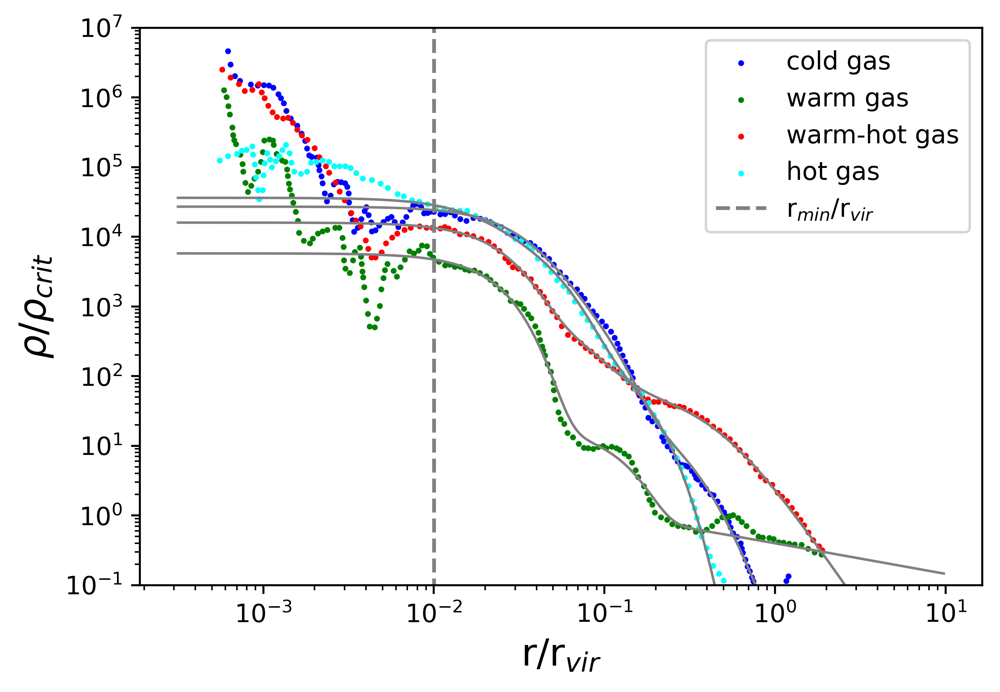

In [289]:
plt.figure(figsize=(6, 4), dpi=500)

distance    = 8 * u.kpc  

r_min_kpc = distance*np.sin(np.radians(17))

import csv
def plotting_function(filename, gas_type, color, A=0, B=0):
    with open(filename, mode='r') as file:
        reader = csv.reader(file, delimiter=",")
        next(reader)
        x = []
        y = []
        for r in reader:
            #print(r[4],r[5],r[6])
            #led_positions.setdefault(r[0],{}).update({r[1]: np.array([r[2], r[3]]).astype(float)})
            x.append(float(r[5]))
            y.append(float(r[6]))
    x = np.array(x)
    y = np.array(y)

    xdata = 10**x
    ydata = 10**y

    plt.scatter(10**x, 10**y, s=7,marker=".",color=color,label=gas_type + " gas")
    
    if A!=0:
        x = np.arange(-3.5,0.5,0.01)
        x_exp = 10**x
        plt.plot(x_exp,A * (x_exp)**B, color=color)

plotting_function("E2K_Gas_Cold.csv", "cold", "blue", 0, 0)
plotting_function("E2K_Gas_Warm.csv", "warm", "green", 0, 0)
plotting_function("E2K_Gas_Warm_Hot.csv", "warm-hot", "red", 0, 0)
plotting_function("E2K_Gas_Hot.csv", "hot", "cyan", 0, 0)


x = np.arange(-3.5,1,0.01)
x_exp = 10**x
# plt.plot(x_exp,A * (x_exp)**B, label="0th order excel fit")
plt.plot(x_exp, a1_c / (1+(x_exp/b1_c)**2)**c1_c + \
                 a2_c / (1+(x_exp/b2_c)**2)**c2_c + \
                 a3_c / (1+(x_exp/b3_c)**2)**c3_c, lw="1", ls="-", color="gray")

plt.plot(x_exp,  a1_w / (1+(x_exp/b1_w)**2)**c1_w + \
                 a2_w / (1+(x_exp/b2_w)**2)**c2_w + \
                 a3_w / (1+(x_exp/b3_w)**2)**c3_w, lw="1", ls="-", color="gray")

plt.plot(x_exp,  a1_wh / (1+(x_exp/b1_wh)**2)**c1_wh + \
                 a2_wh / (1+(x_exp/b2_wh)**2)**c2_wh + \
                 a3_wh / (1+(x_exp/b3_wh)**2)**c3_wh, lw="1", ls="-", color="gray")

plt.plot(x_exp,  a1_h / (1+(x_exp/b1_h)**2)**c1_h + \
                 a2_h / (1+(x_exp/b2_h)**2)**c2_h + \
                 a3_h / (1+(x_exp/b3_h)**2)**c3_h, lw="1", ls="-", color="gray")



plt.plot([r_min_kpc.value,r_min_kpc.value]/r_vir_kpc.value,[10e-6,10e8], "--", label="r$_{min}$/r$_{vir}$", color="gray")


# def power_law_fit(x, A, B):
#     return A * x**B
# x = np.arange(-3.5,1,0.01)
# x_exp = 10**x
# plt.plot(x_exp,power_law_fit(x_exp, *parameters), label="0th order scipy fit")


plt.yscale('log')
plt.xscale('log')

plt.ylim([1e-1,10e6])
plt.xlabel(r'r/r$_{vir}$',size=15)
plt.ylabel("rho/rho_crit",size=15)
plt.ylabel(r'$\rho/\rho_{crit}$',size=15)
plt.legend()
#plt.savefig("E2K_fitted_gas_functions_ratios_unitless.png")
plt.show()



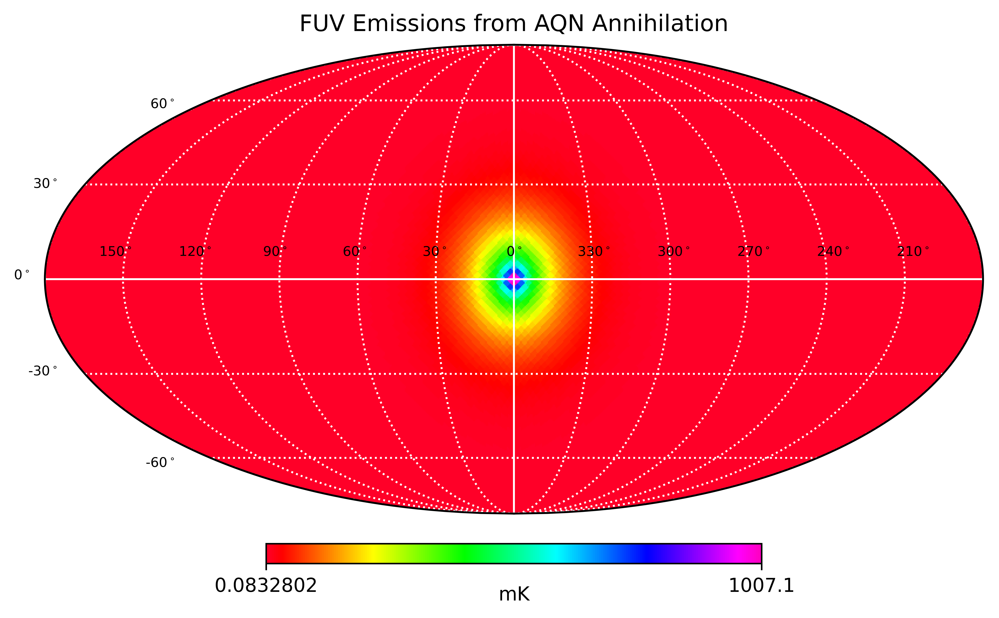

In [290]:
F_tot_galex

create_skymap2(F_tot_galex, F_tot_galex.unit, False)

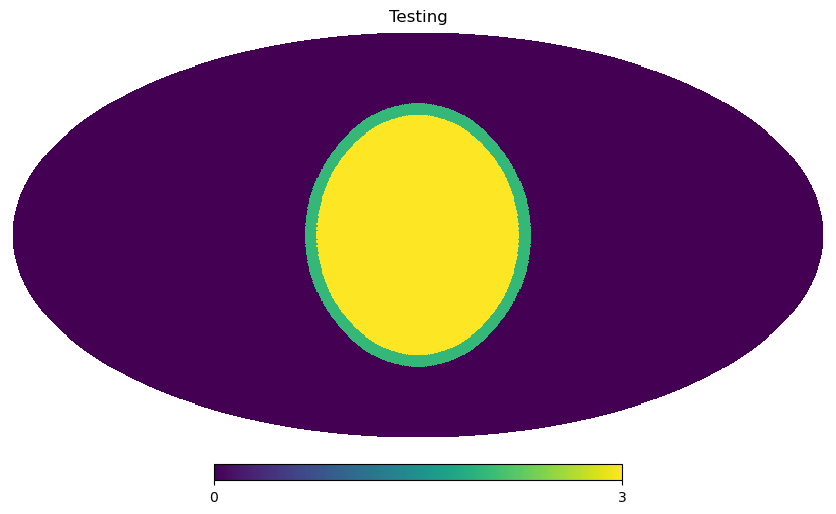

In [160]:
N = 2**8
test_array = np.zeros(hp.nside2npix(N))

# Convert the celestial pole to a unit vector
vec = hp.ang2vec(np.pi/2, 0)

dir1 = [np.pi/2, 0]
dir2 = [np.pi/4, 0]
dir3 = [3*np.pi/4, 0]
dir4 = [np.pi/2, np.pi/4]

test_array[hp.pixelfunc.ang2pix(N, theta=dir1[0], phi=dir1[1])] = 1
test_array[hp.pixelfunc.ang2pix(N, theta=dir2[0], phi=dir2[1])] = 1
test_array[hp.pixelfunc.ang2pix(N, theta=dir3[0], phi=dir3[1])] = 1
test_array[hp.pixelfunc.ang2pix(N, theta=dir4[0], phi=dir4[1])] = 1


# Set the radius to 5 degrees
dtheta_deg = 5
radius_inner = np.radians(45)
radius_outer = np.radians(45 + dtheta_deg)

# Select the pixels within the disc
pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)
pix_ring = np.setdiff1d(pix_outer, pix_inner)



test_array[pix_outer] = 2
test_array[pix_inner] = 3
test_array[pix_ring] = 2

hp.mollview(test_array , 
            title="Testing", 
            rot=(0,0,0))


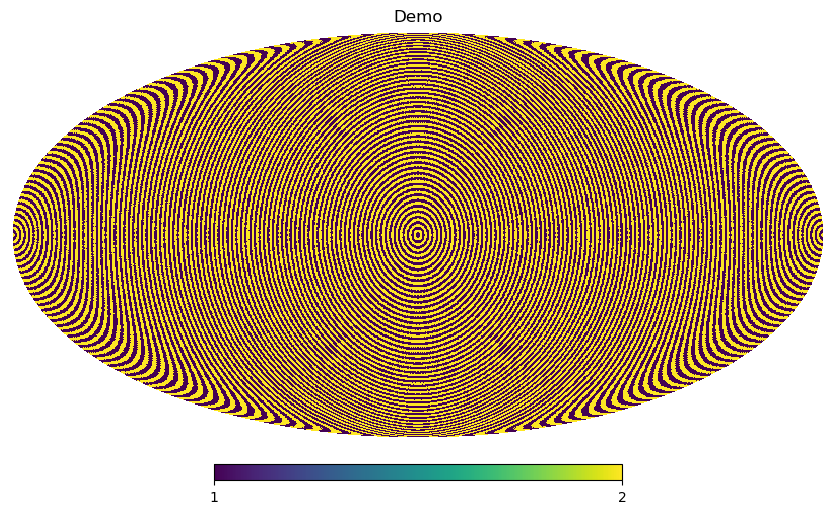

In [285]:
N = 2**8
test_array = np.zeros(hp.nside2npix(N))

# test_array[pix_outer] = 1
# test_array[pix_inner] = 2
# test_array[pix_ring] = 1

# Convert the celestial pole to a unit vector
vec = hp.ang2vec(np.pi/2, 0)


for i in np.arange(0,180,1):
    radius_inner = np.radians(i)
    radius_outer = np.radians(i + 1)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    test_array[pix_ring] = i % 2 + 1
    
hp.mollview(test_array , 
            title="Demo", 
            rot=(0,0,0))


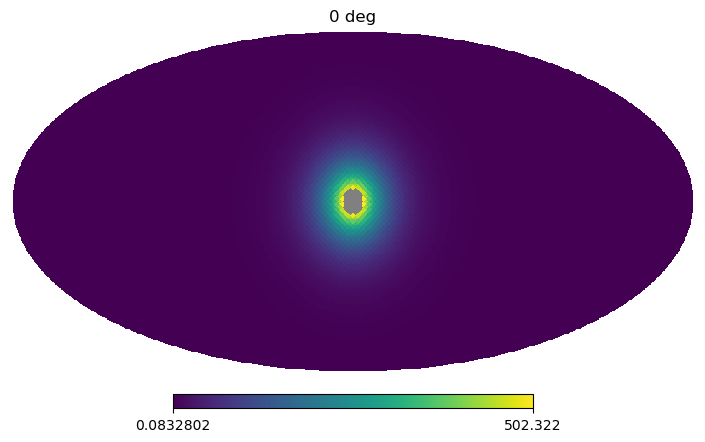

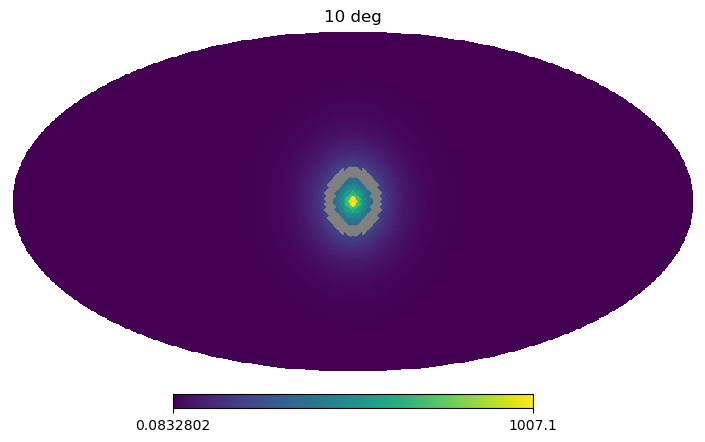

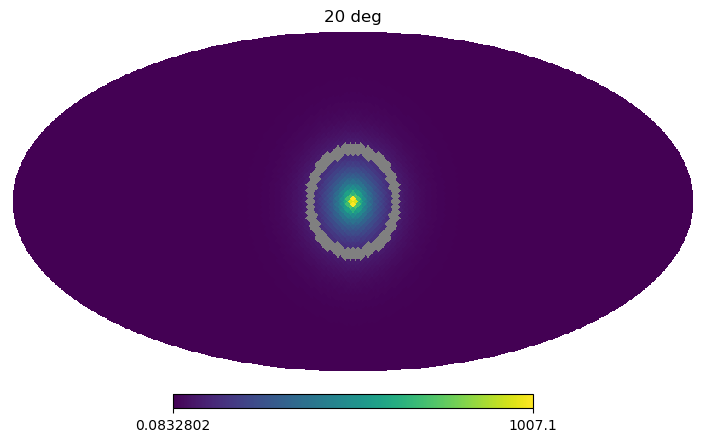

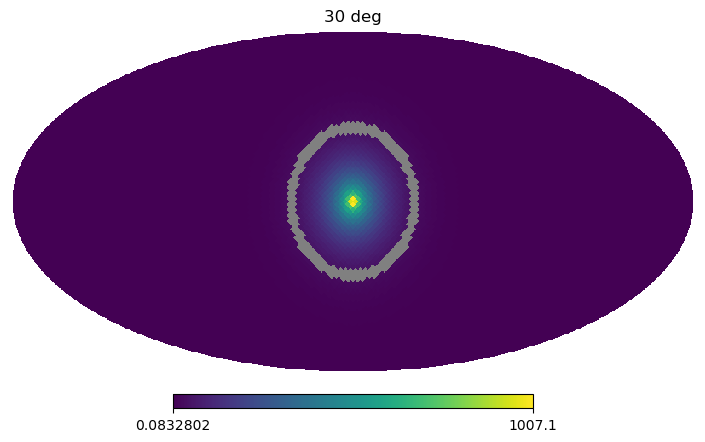

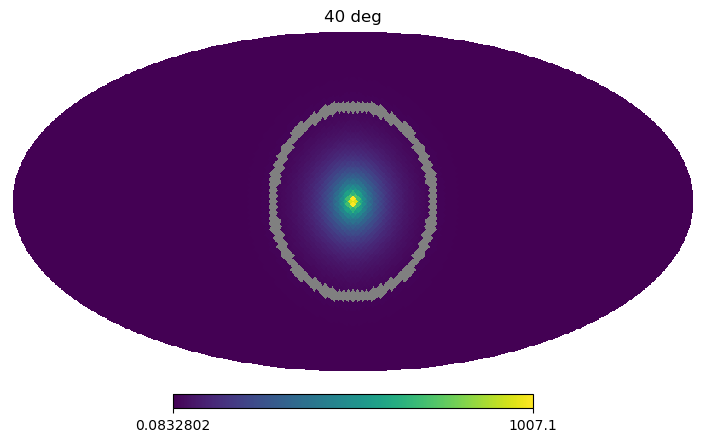

...

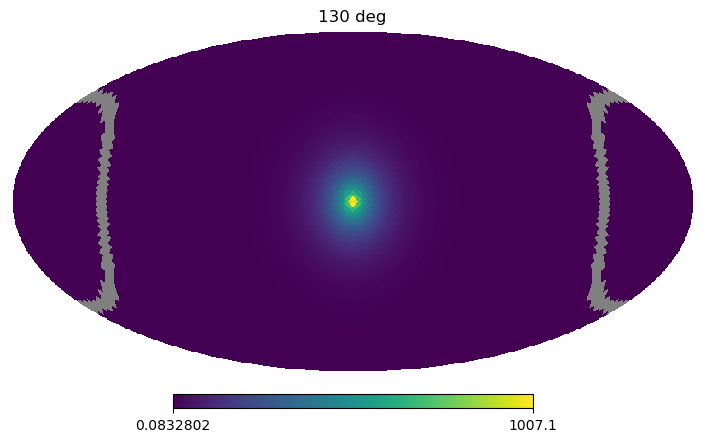

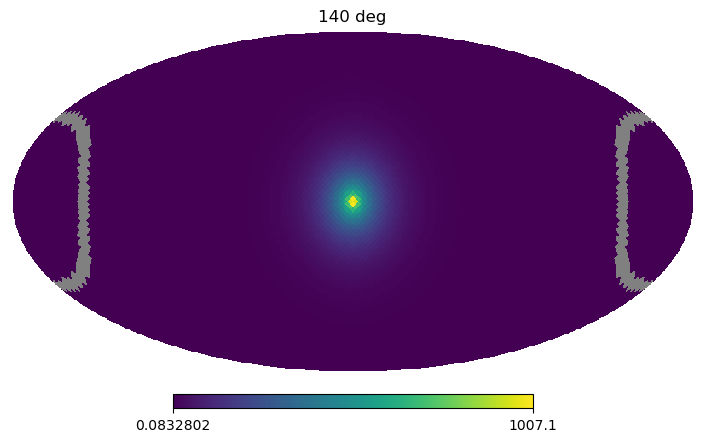

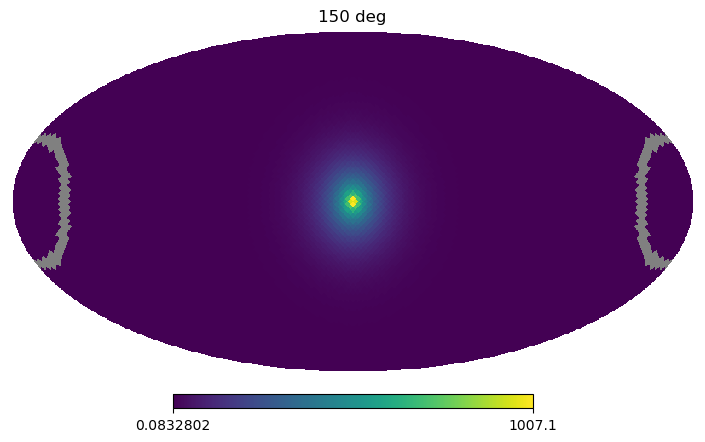

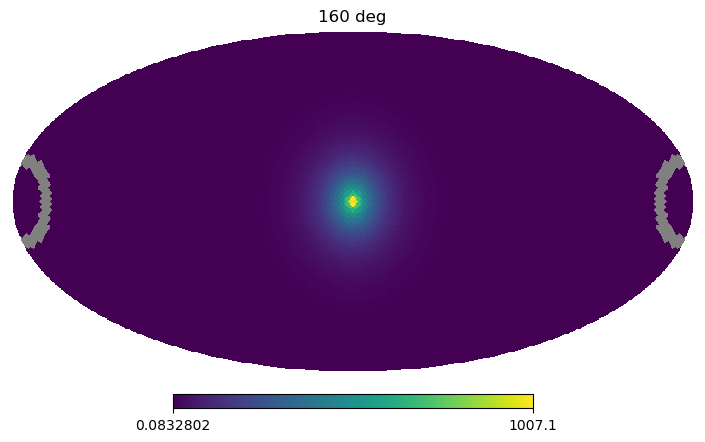

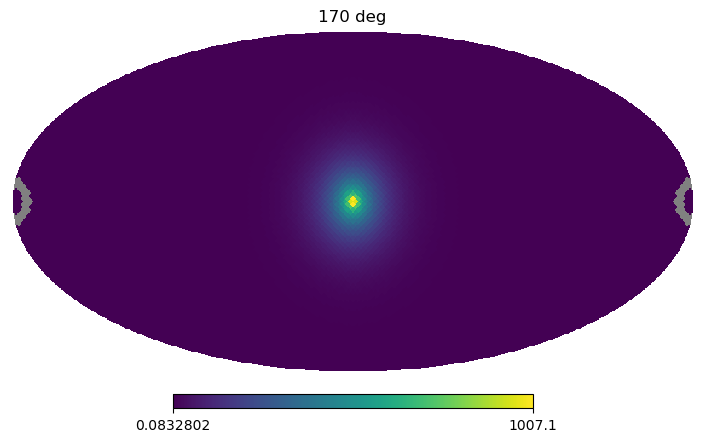

In [291]:
N = 2**5
angular_flux = np.zeros(180)

for i in np.arange(0,180,1):
    radius_inner = np.radians(i)
    radius_outer = np.radians(i + 5)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    angular_flux[i] = np.average(F_tot_galex[pix_ring]).value
    
    if i % 10 == 0:
        f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
        plot_with_ring = F_tot_galex.value.copy()
        plot_with_ring[pix_ring] = np.nan
        hp.mollview(plot_with_ring , 
                    title=str(i) + " deg", 
                    rot=(0,0,0), 
                    fig=f1, 
                    unit="")
        plt.show()

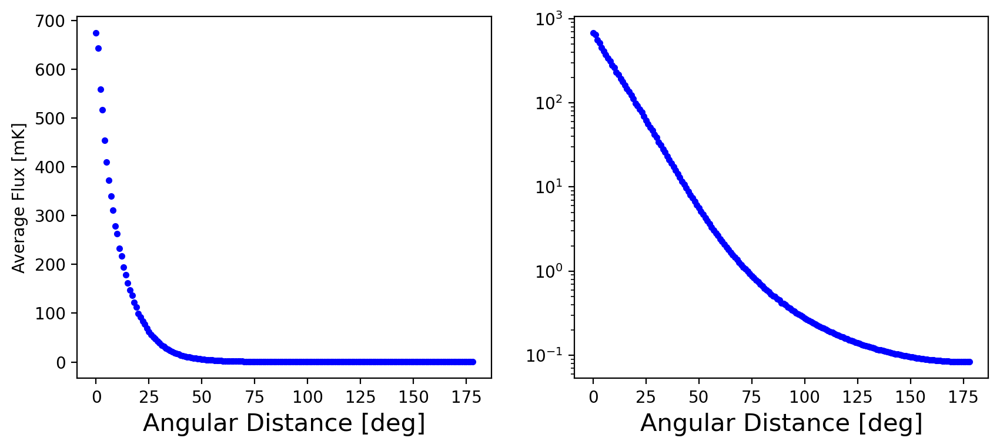

In [292]:
# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=200)

# Plot the data on the left subplot
ax1.plot(np.arange(0,180,1),angular_flux, '.', color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(np.arange(0,180,1),angular_flux, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.show()

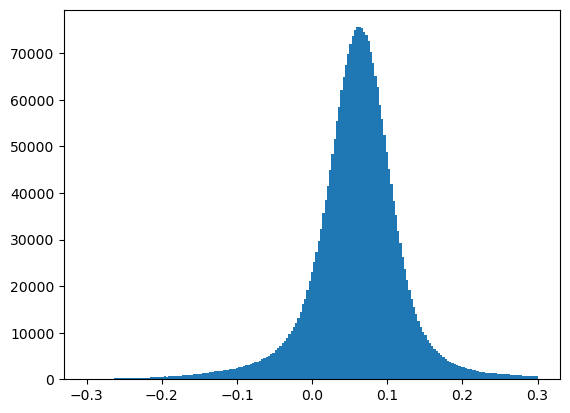

In [264]:
# Importing WMAP Haze data
# .fits file taken from https://faun.rc.fas.harvard.edu/dfink/skymaps/haze/table/
location = "/data4/msekatchev/wmaphaze/"
location = "WMAP/"
filename = "wmap_k_ffhaze_yr1.fits"
wmaphaze = hp.read_map(location + filename)

plt.hist(wmaphaze[np.where(wmaphaze != 0)], bins = np.linspace(-0.3,0.3,200))
#plt.xlim([-0.5,0.5])
plt.show()

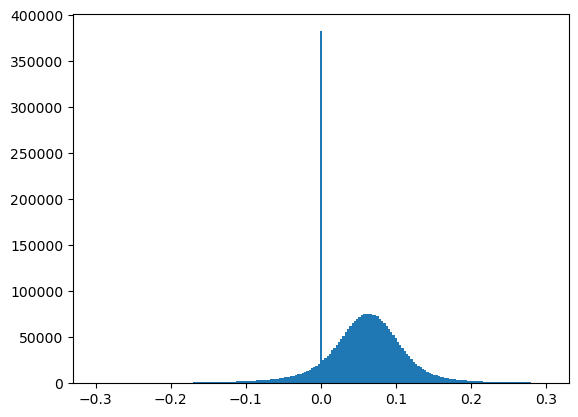

In [244]:
plt.hist(wmaphaze, bins = np.linspace(-0.3,0.3,200))
plt.show()

In [303]:
((10**105 * u.TeV / u.m**3).to(u.MeV / u.m**3) /(4870 * u.MeV / u.m**3))

<Quantity 2.05338809e+107>

In [187]:
radius_inner = np.radians(50)
radius_outer = np.radians(50 + 1)

pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

pix_ring = np.setdiff1d(pix_outer, pix_inner)


In [280]:
unfiltered_signal = wmaphaze[pix_ring]
print(unfiltered_signal)
filtered_signal = unfiltered_signal[unfiltered_signal != 0]
print("\n",filtered_signal)
np.average(filtered_signal)


[0.44947785 0.44485897 0.4310017  ... 0.1566823  0.15961103 0.16263033]

 [0.44947785 0.44485897 0.4310017  ... 0.1566823  0.15961103 0.16263033]


0.2528219

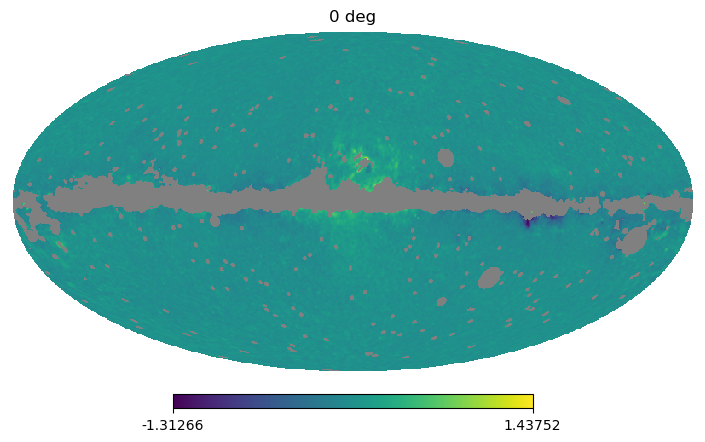

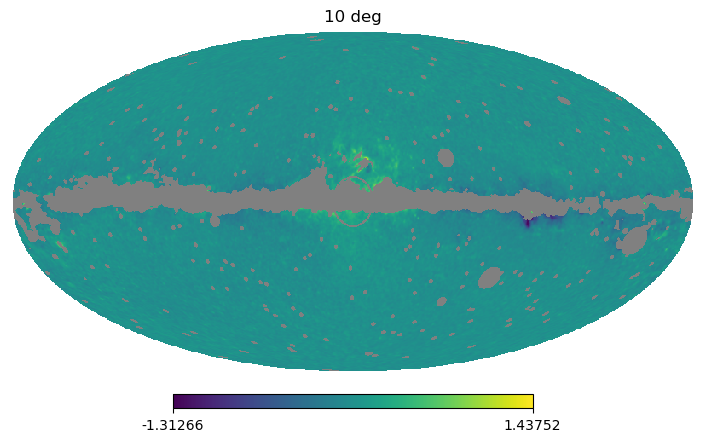

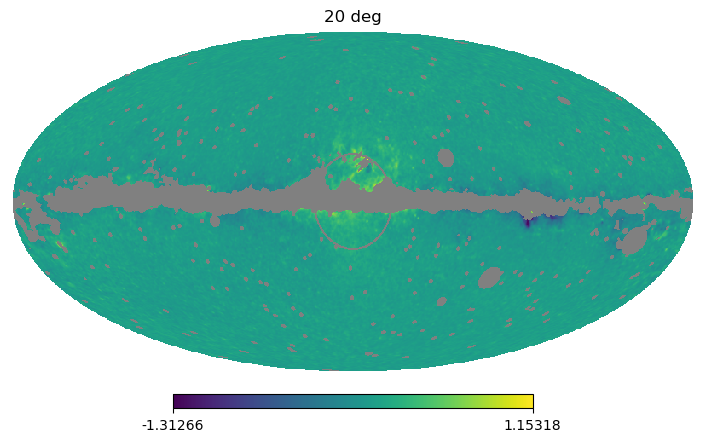

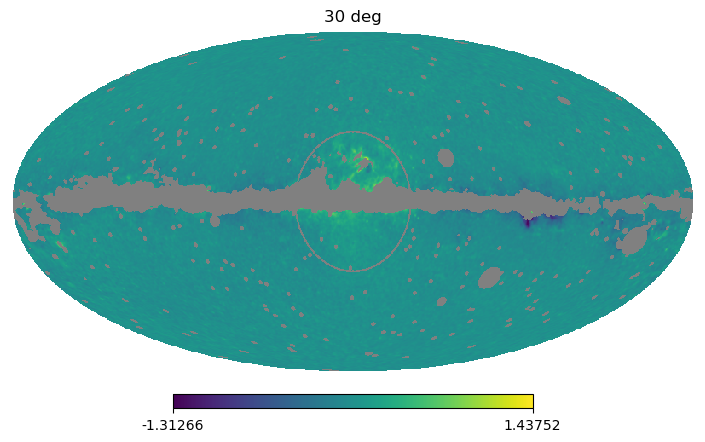

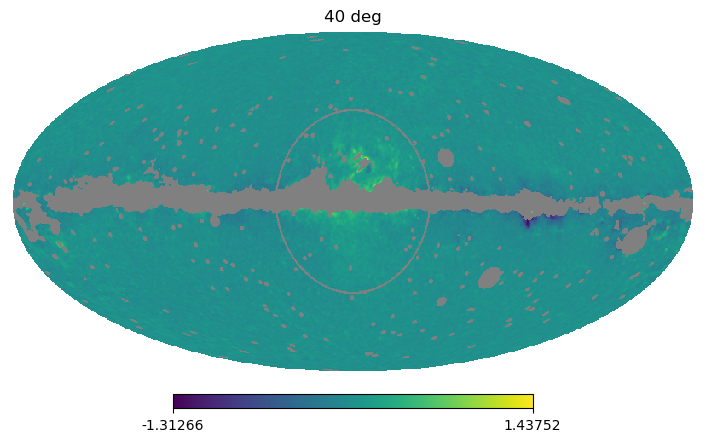

...

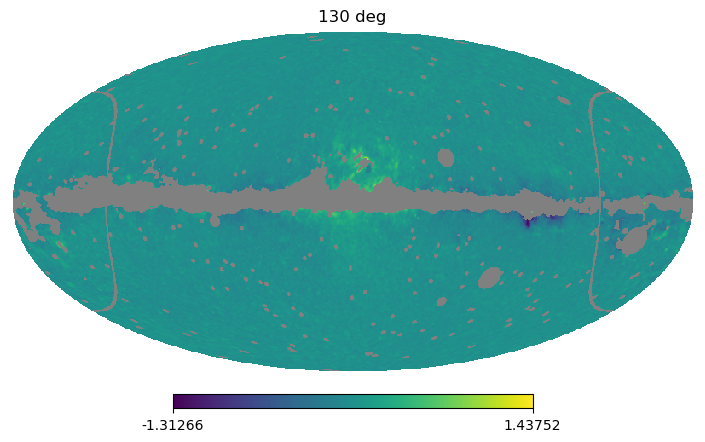

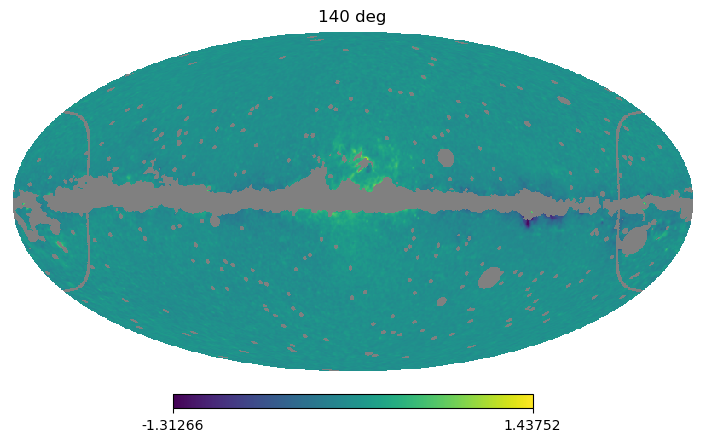

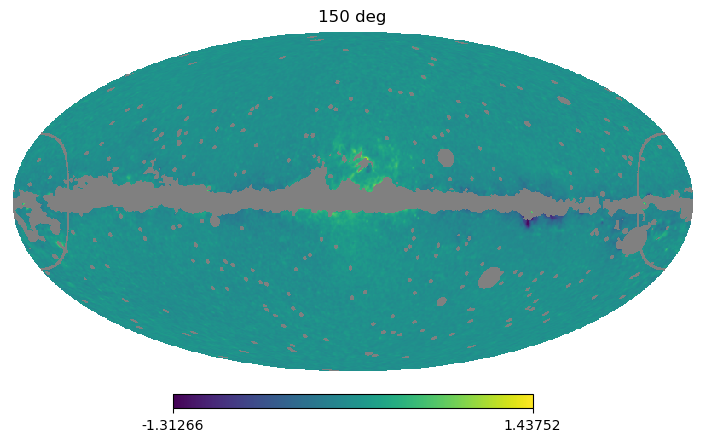

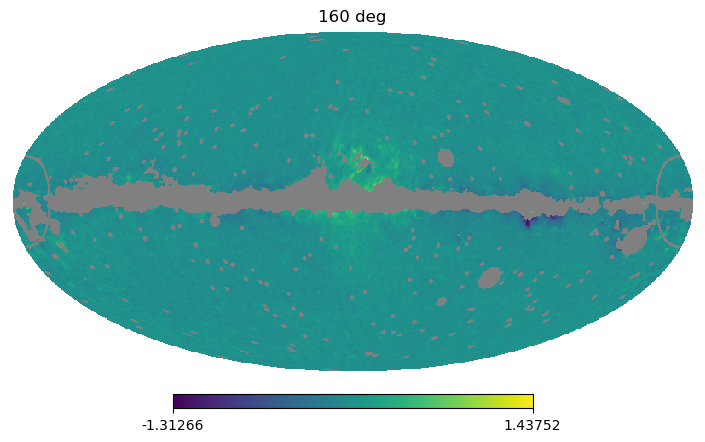

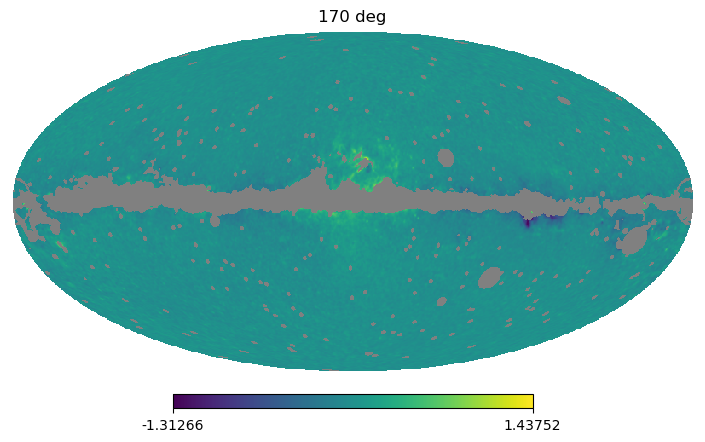

In [282]:
N = 2**9
angular_flux_wmap = np.zeros(180)

for i in np.arange(0,180,1):
    radius_inner = np.radians(i)
    radius_outer = np.radians(i + 1)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    unfiltered_signal = wmaphaze[pix_ring]
    filtered_signal = unfiltered_signal[unfiltered_signal != 0]
    
    
    angular_flux_wmap[i] = np.average(filtered_signal)
    
    if i % 10 == 0:
        f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
        plot_with_ring = wmaphaze.copy()
        plot_with_ring[wmaphaze==0] = np.nan
        plot_with_ring[pix_ring] = np.nan
        hp.mollview(plot_with_ring, 
                    title=str(i) + " deg", 
                    rot=(0,0,0), 
                    fig=f1, 
                    unit="")
        plt.show()

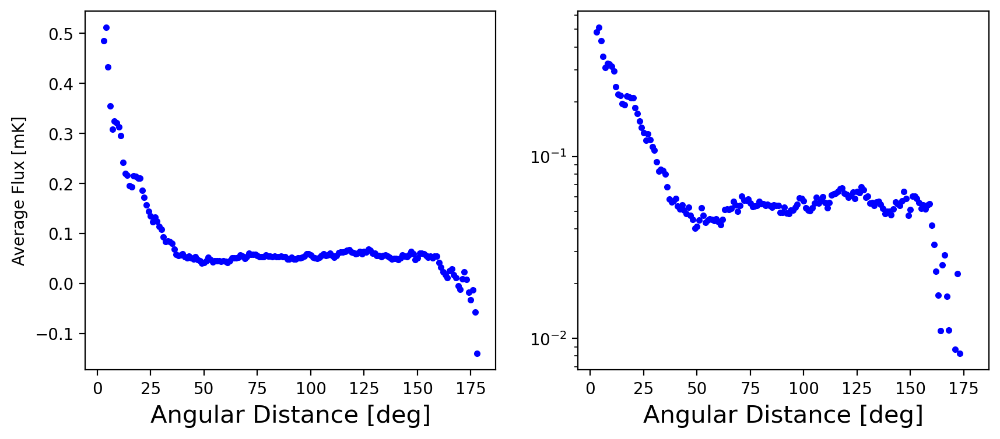

In [283]:
# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=200)

# Plot the data on the left subplot
ax1.plot(np.arange(0,180,1),angular_flux_wmap, '.', color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(np.arange(0,180,1),angular_flux_wmap, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.show()

Using $\Delta \theta = 5^{\circ}$
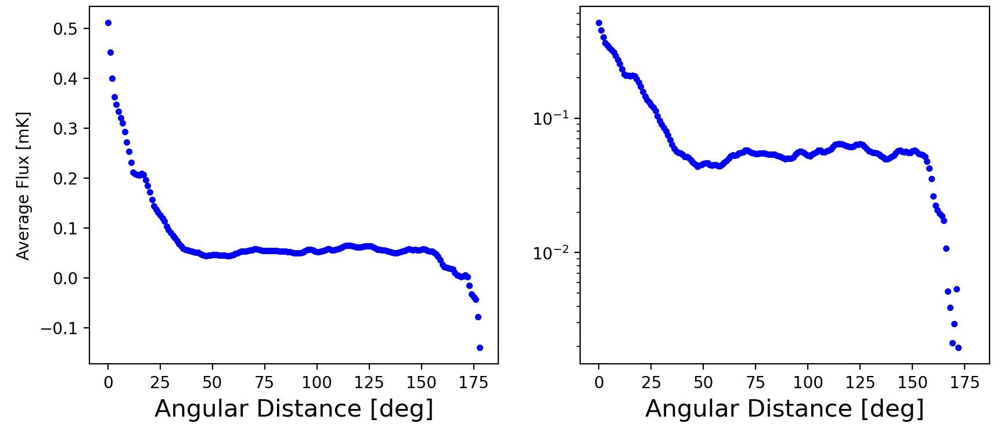

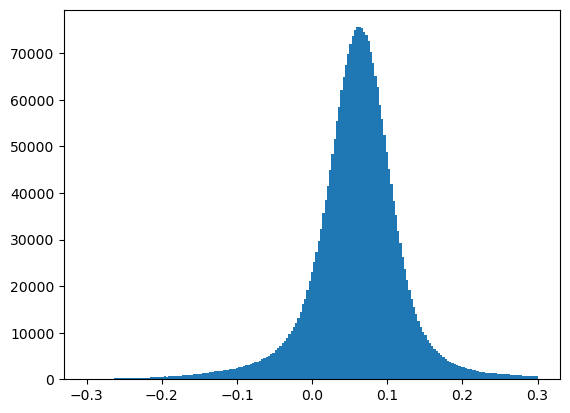

In [267]:
plt.hist(wmaphaze[np.where(wmaphaze != 0)], bins = np.linspace(-0.3,0.3,200))
#plt.xlim([-0.5,0.5])
plt.show()

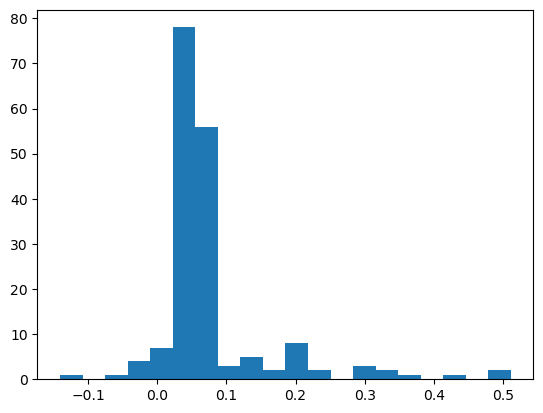

In [271]:
plt.hist(angular_flux_wmap, bins=20)
#plt.xlim([-0.5,0.5])
plt.show()

In [207]:
np.nan

nan

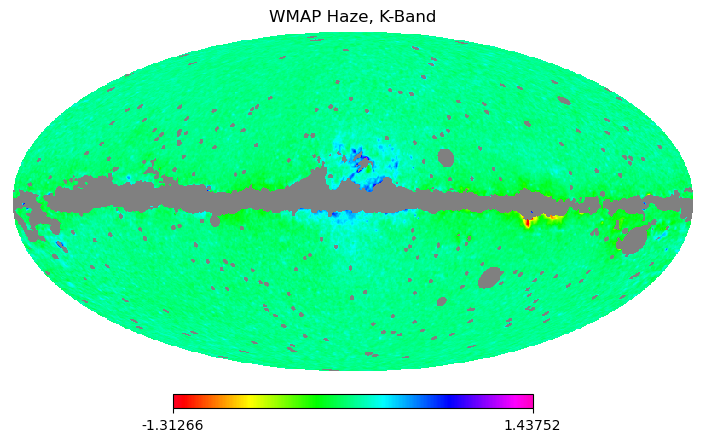

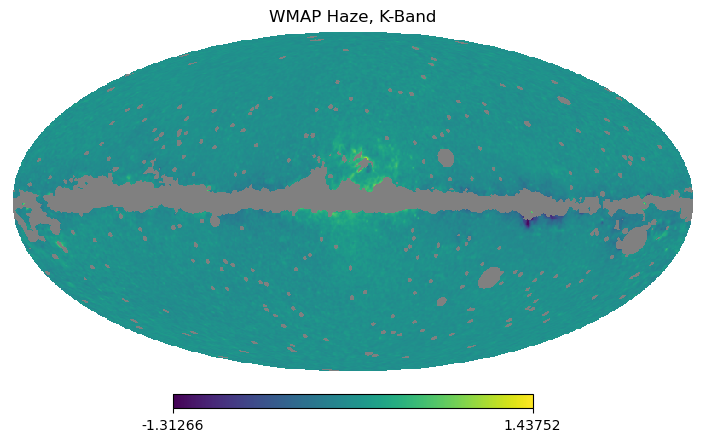

In [263]:
f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
#wmaphaze[np.where(wmaphaze==0)] = -1000
plot_wmaphaze = wmaphaze.copy()
plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(wmaphaze , 
            title="WMAP Haze, K-Band", 
            rot=(0,0,0),
            cmap='gist_rainbow', 
            fig=f1, 
            unit="")
plt.show()
f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
plot_wmaphaze = wmaphaze.copy()
plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(wmaphaze , 
            title="WMAP Haze, K-Band", 
            rot=(0,0,0), 
            fig=f1, 
            unit="")

#plt.savefig("WMAP_Haze.svg")
plt.show()

In [104]:
inner = np.array([1,11,117,5])
outer = np.array([1,11,117,0,123,5])

np.setdiff1d(outer, inner)

array([  0, 123])

In [99]:
len(pix_inner)

115144

In [68]:
print(hp.rotator.angdist(dir1, dir2),
      hp.rotator.angdist(dir1, dir3),
      hp.rotator.angdist(dir1, dir4))

[0.78539816] [0.78539816] [0.78539816]


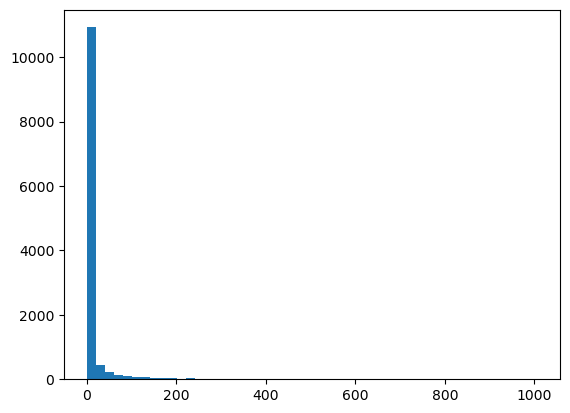

In [26]:
plt.hist(F_tot_galex.value, bins=50)
plt.show()

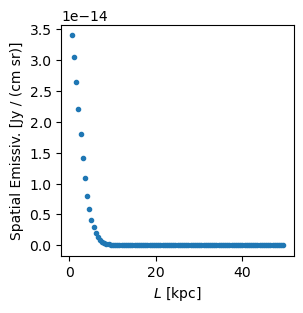

Unit("Jy / (cm sr)")

In [ ]:
spectral_spatial_emissivity
# integrate along the bandwidth
# calculate spectral spatial emissivity


plt.figure(dpi=100,figsize=(3,3))
plt.plot(l_list,spectral_spatial_emissivity[:,500], ".")
plt.xlabel("$L$ [kpc]")
plt.ylabel("Spatial Emissiv. ["+str(spectral_spatial_emissivity.unit)+"]")
plt.show()
spectral_spatial_emissivity.unit

In [56]:
frequency_band = np.arange(f_min_hz.value, f_max_hz.value, frequency_band_resolution) * u.Hz
frequency_band

<Quantity [2.025e+10, 2.125e+10, 2.225e+10, 2.325e+10, 2.425e+10,
           2.525e+10] Hz>

In [54]:
f_min_hz

<Quantity 2.025e+10 Hz>

In [55]:
f_max_hz

<Quantity 2.575e+10 Hz>

In [50]:
# sightline elements
l_min_kpc = l_min*u.kpc
l_max_kpc = l_max*u.kpc
l_list = np.arange(l_min_kpc.value,l_max_kpc.value,dl.value)[:, np.newaxis]
len(l_list)

frequency_band.to(u.GHz)

<Quantity [20.25] GHz>

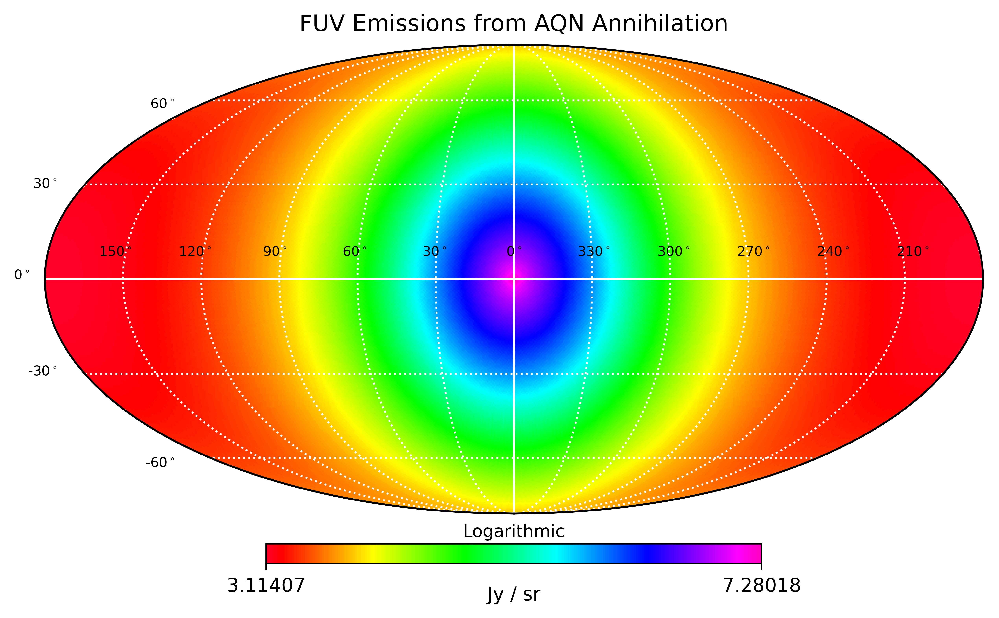

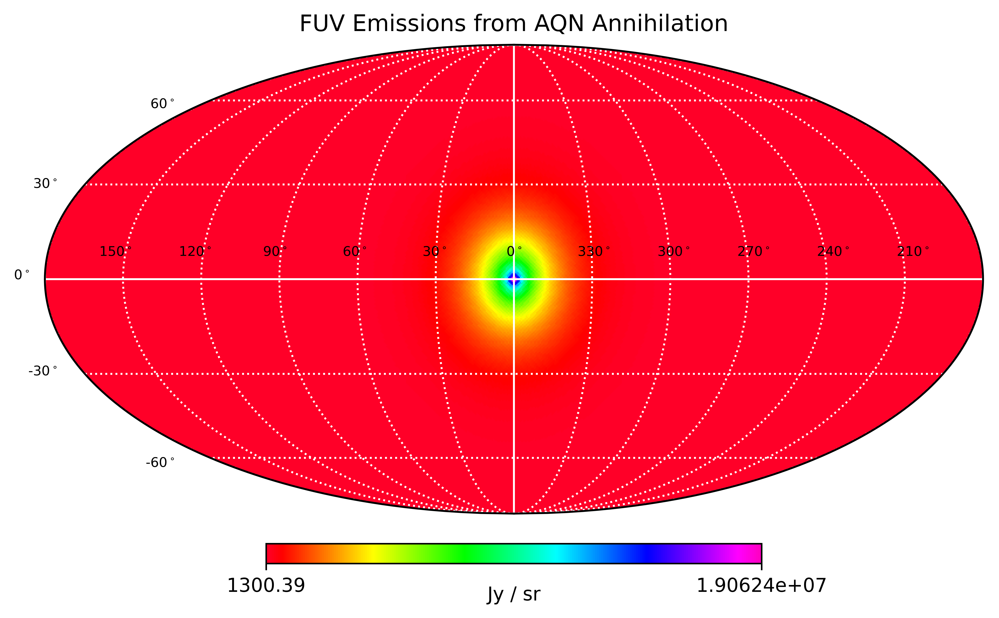

In [81]:
create_skymap2(F_tot_galex, F_tot_galex.unit, False)

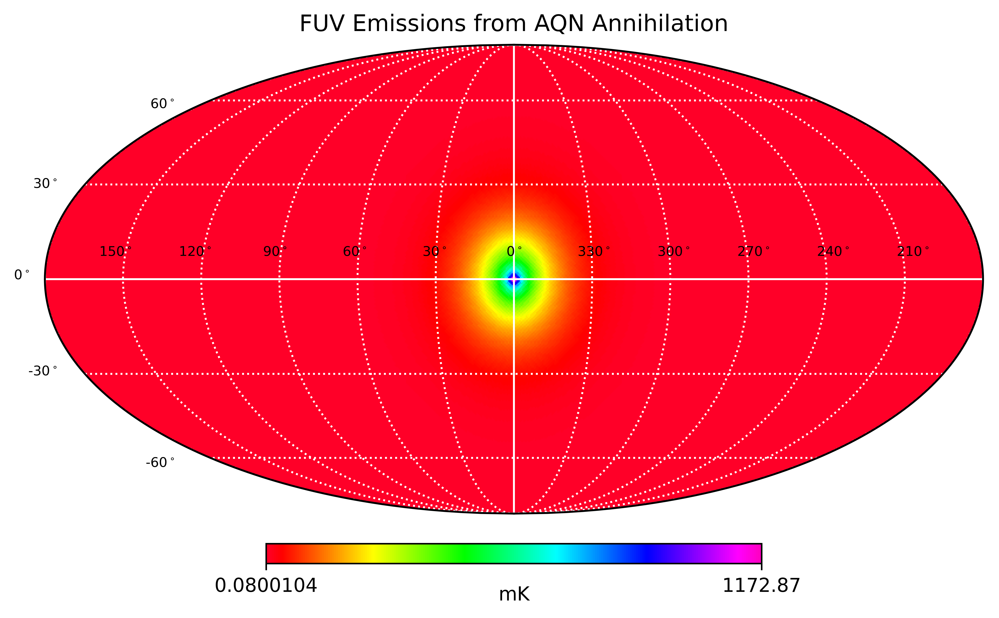

In [85]:
create_skymap2(F_tot_galex.to(u.mK, u.brightness_temperature(23*u.GHz)), str("mK"), False)

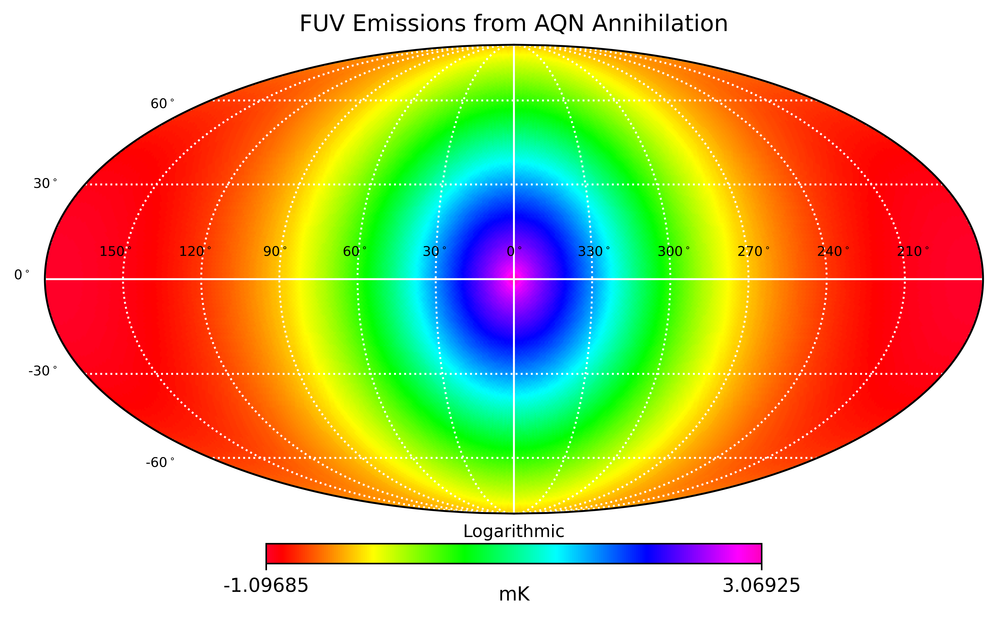

In [84]:
create_skymap2(F_tot_galex.to(u.mK, u.brightness_temperature(23*u.GHz)), str("mK"), True)

In [146]:
l_array[5]

array([3.1, 3.1, 3.1, ..., 3.1, 3.1, 3.1])

## Look at $T_{\text{AQN}}$ from a gas component at a particular distance from earth



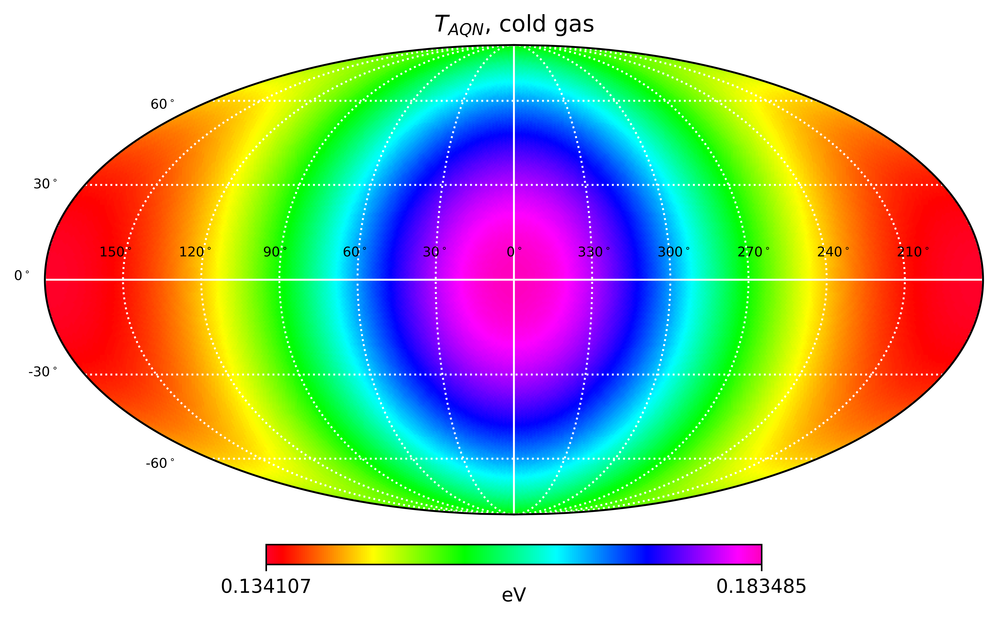

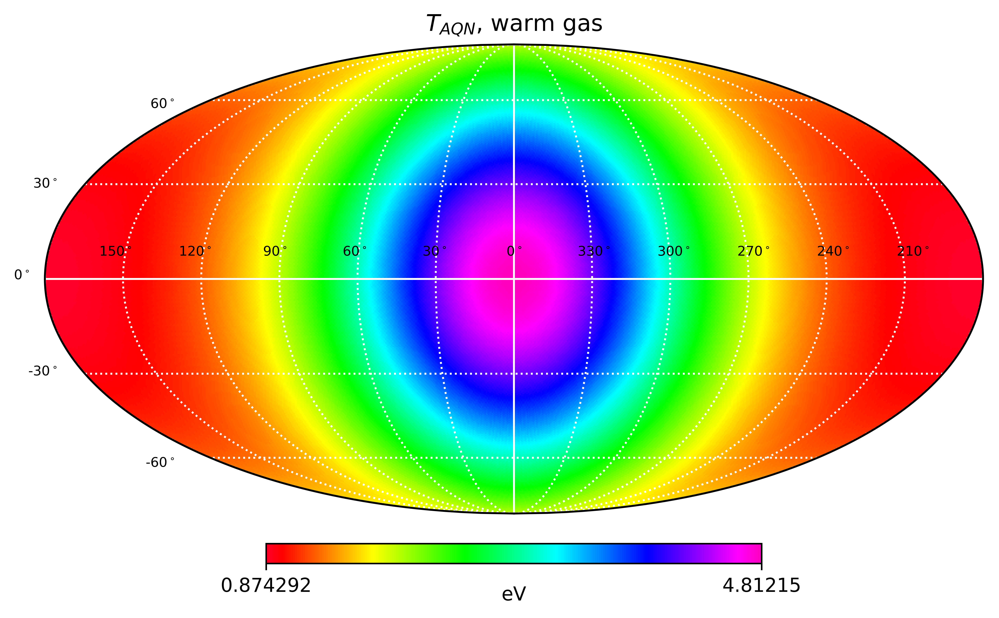

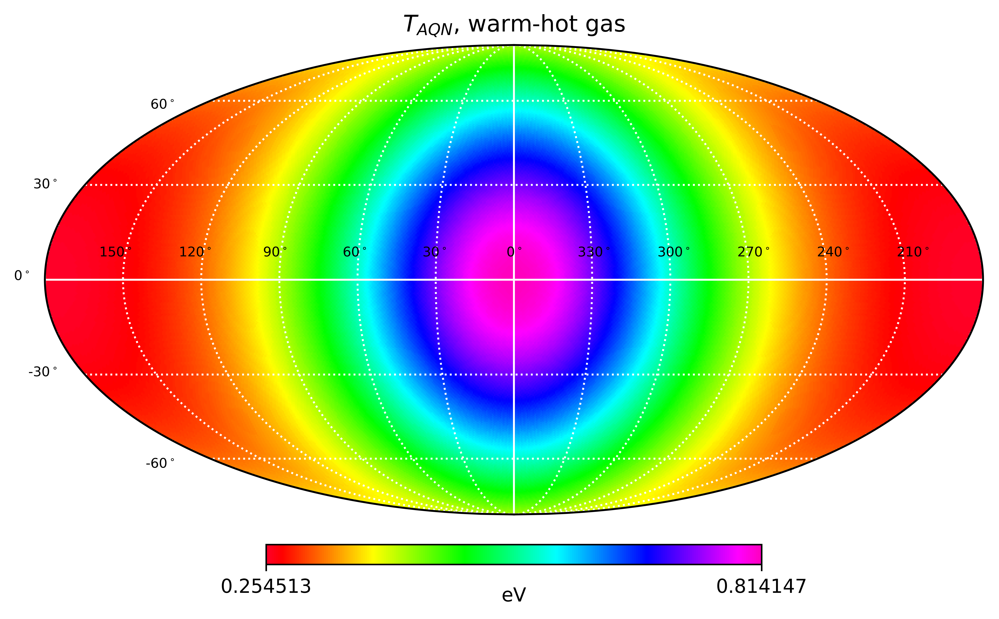

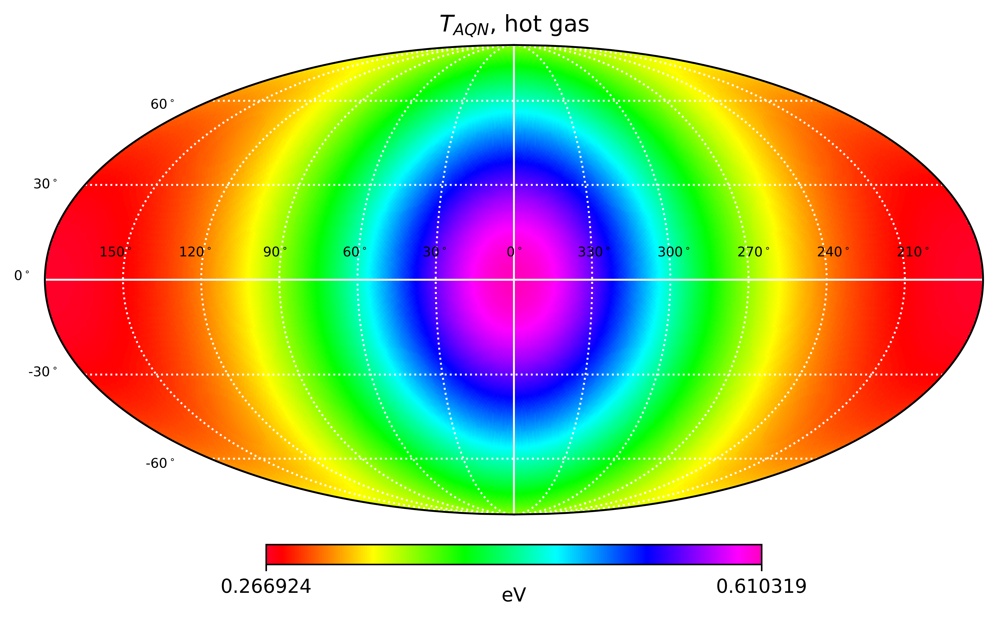

In [42]:
l_array_index = 5
create_skymap_T_aqn(T_aqn_dict_ev["cold"    ][l_array_index,:], "cold gas"    )
create_skymap_T_aqn(T_aqn_dict_ev["warm"    ][l_array_index,:], "warm gas"    )
create_skymap_T_aqn(T_aqn_dict_ev["warm_hot"][l_array_index,:], "warm-hot gas")
create_skymap_T_aqn(T_aqn_dict_ev["hot"     ][l_array_index,:], "hot gas"     )

In [80]:
np.where(theta<=0.05)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23]),)

In [83]:
NSIDE

64

In [88]:
hp.pixelfunc.ang2pix(NSIDE, theta=1, phi=0)

11392

In [91]:
npix = hp.nside2npix(2**3)

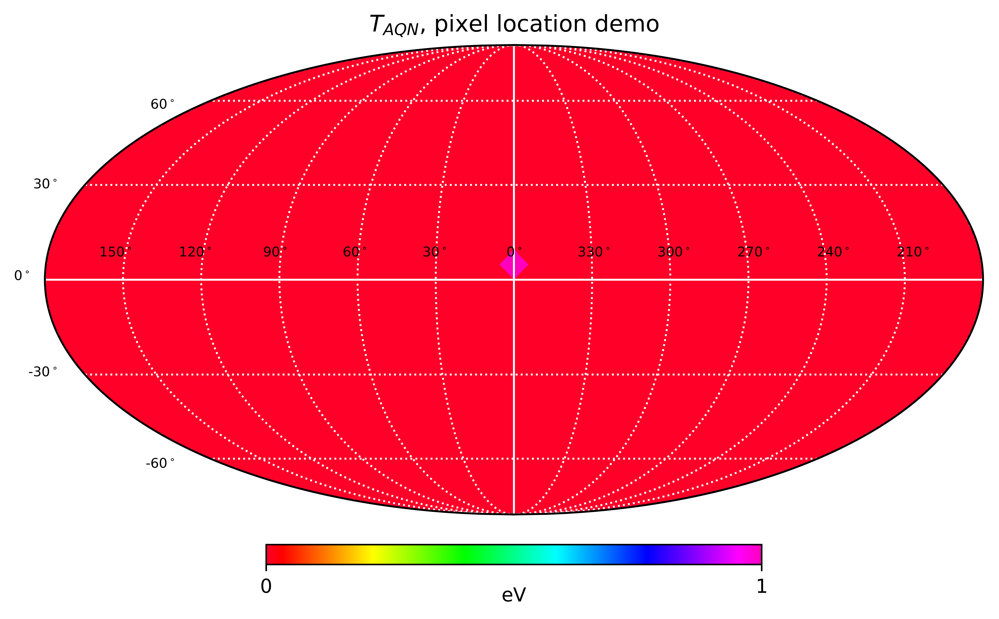

In [125]:
test_array = np.zeros(npix)
test_array[hp.pixelfunc.ang2pix(2**3, theta=np.pi/2, phi=0)] = 1

create_skymap_T_aqn(test_array*u.cm, "pixel location demo")

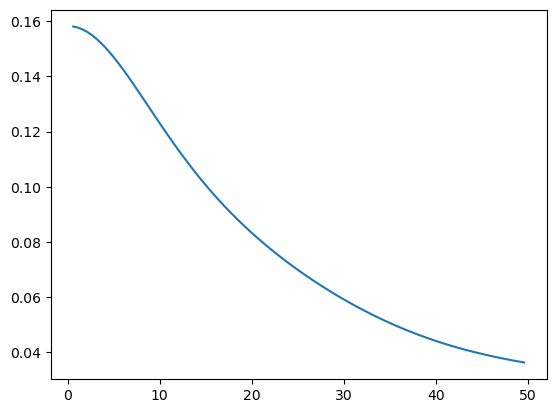

In [117]:
pixel_index = hp.pixelfunc.ang2pix(NSIDE, theta=0, phi=0)
plt.plot(l_array[:,pixel_index],T_aqn_dict_ev["cold"][:,pixel_index])

In [153]:
def plot_temperature_vs_l(T_dict, chosen_theta, chosen_phi):

    pixel_index = hp.pixelfunc.ang2pix(NSIDE, theta=chosen_theta, phi=chosen_phi)

    npix = hp.nside2npix(2**3)
    test_array = np.zeros(npix)
    test_array[hp.pixelfunc.ang2pix(2**3, theta=chosen_theta, phi=chosen_phi)] = 1
    #create_skymap_T_aqn(test_array*u.cm, "pixel location demo")
    hp.mollview(test_array)
    plt.show()


    # Create a 2x2 grid of subplots
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(5, 5), dpi=200)

    # Define the titles for each subplot
    titles = ['cold', 'warm', 'warm_hot', 'hot']

    # Loop through each subplot and add a plot with the given title
    for i, ax in enumerate(axes.flat):
        ax.plot(l_array[:,pixel_index], T_dict[titles[i]][:,pixel_index])
        ax.set_title(titles[i]+" gas")
        #ax.set_xlabel('Distance (earth centric) [kpc]')
        #ax.set_ylabel('$T_{AQN}$ (eV)')
    axes[1][0].set_xlabel('Distance (earth centric) [kpc]')
    axes[1][0].set_ylabel('$T_{AQN}$ (eV)')
    # Adjust the layout and padding of the subplots
    fig.tight_layout(pad=3.0)

    fig.suptitle(r'$\theta = $'+str(round(chosen_theta,4))+', $\phi = $'+str(round(chosen_phi,4)), fontsize=18)

    # Display the figure
    plt.show()

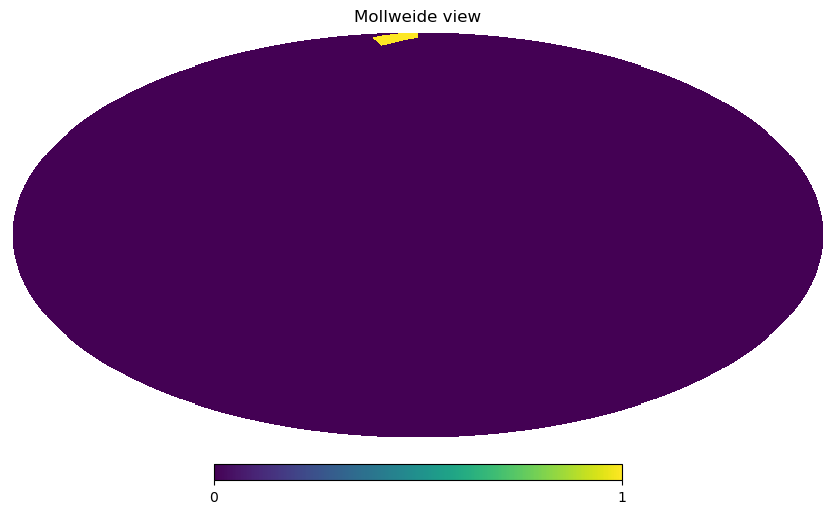

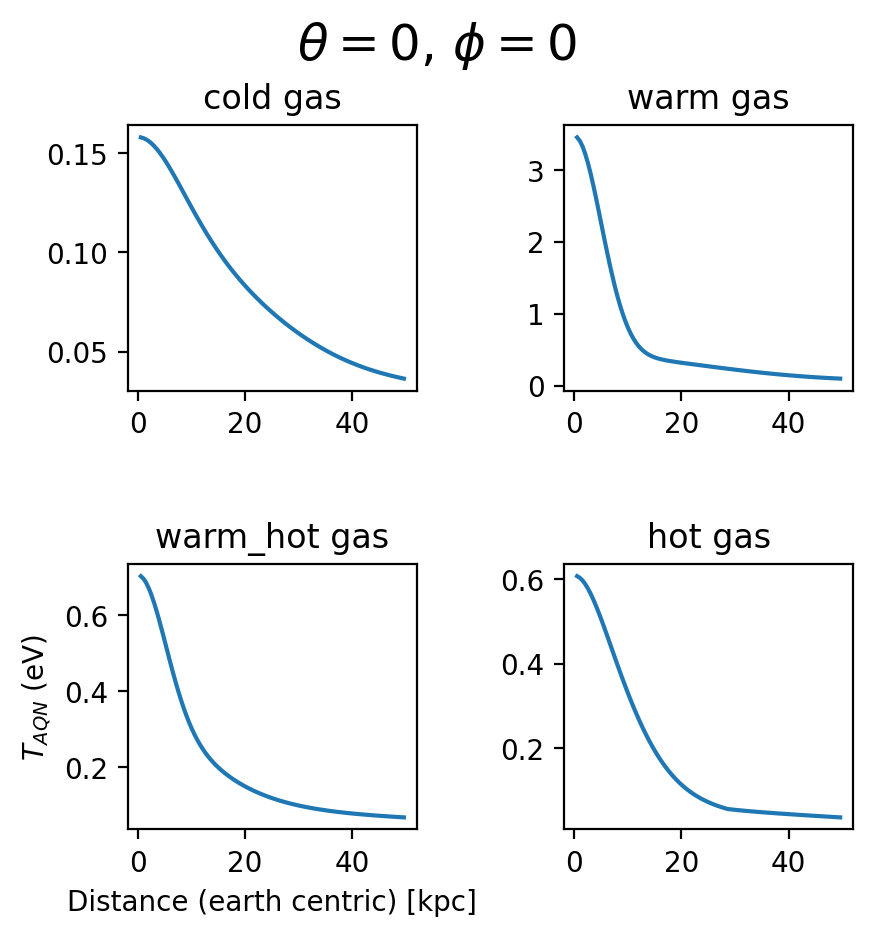

In [154]:
chosen_theta = 0
chosen_phi   = 0

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



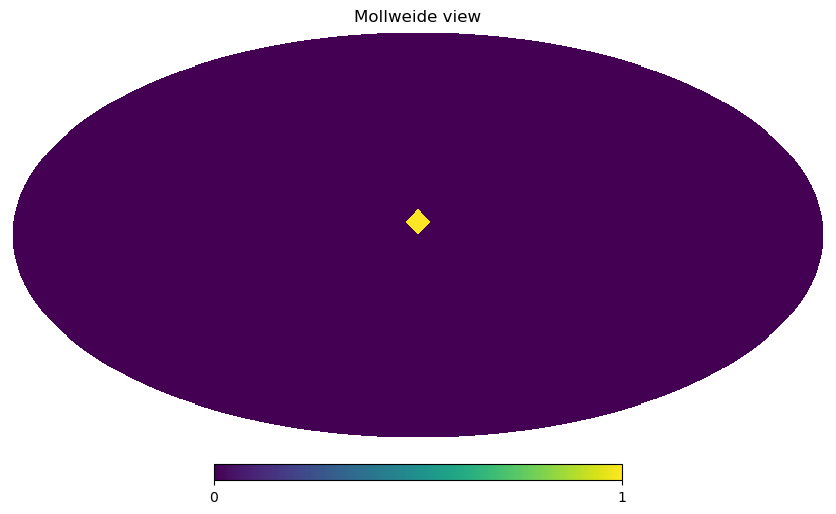

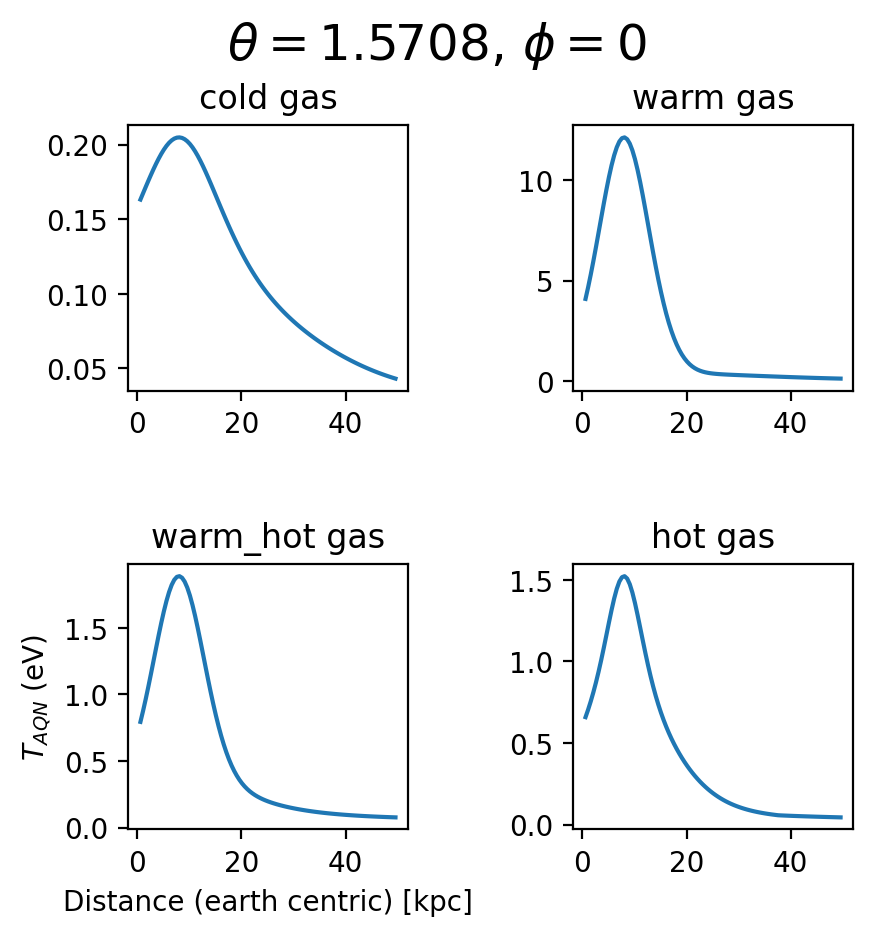

In [155]:
chosen_theta = np.pi/2
chosen_phi   = 0

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



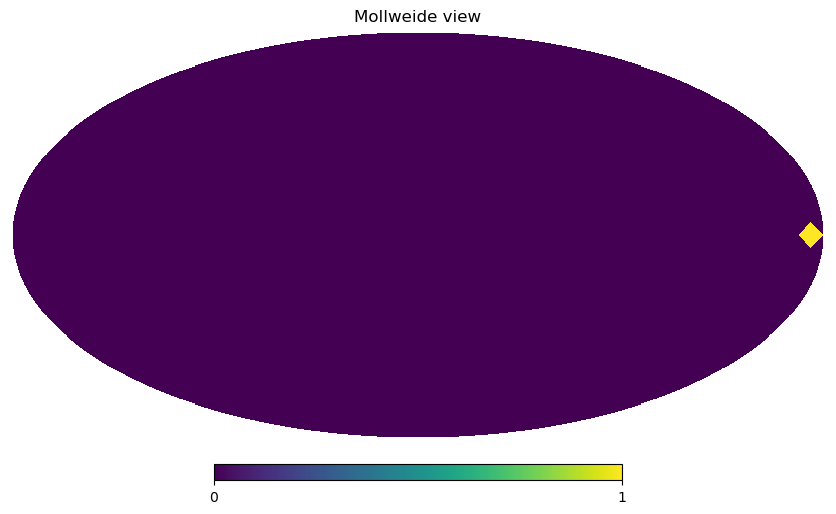

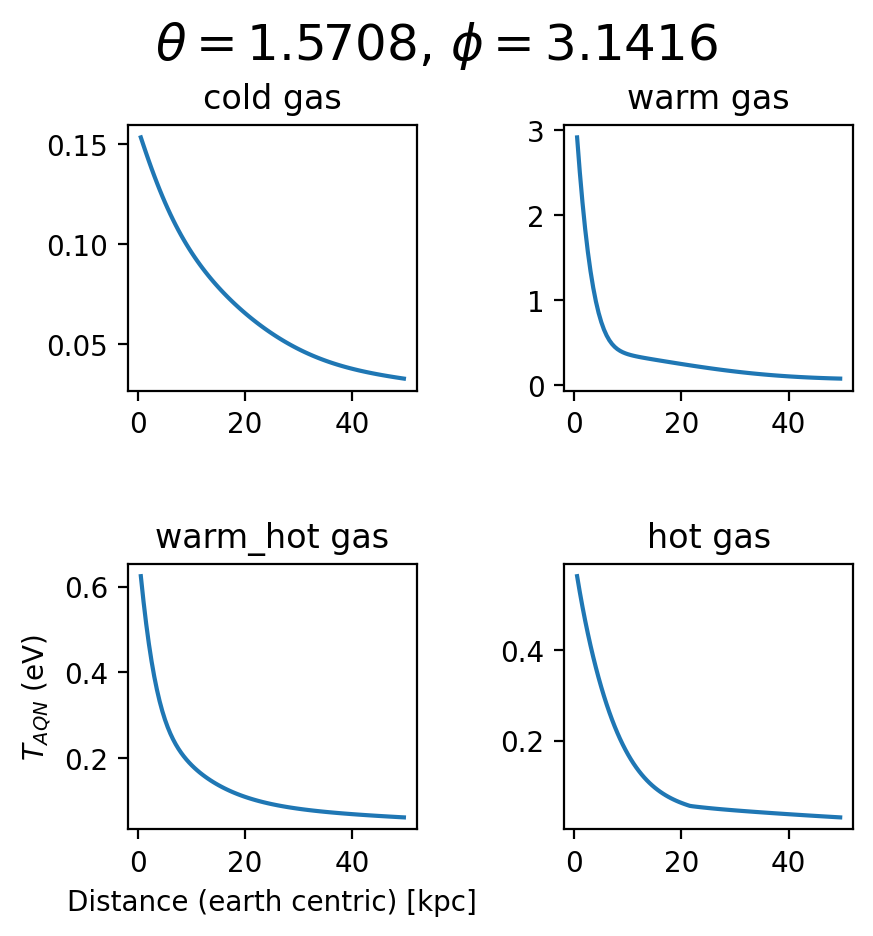

In [156]:
chosen_theta = np.pi/2
chosen_phi   = np.pi

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



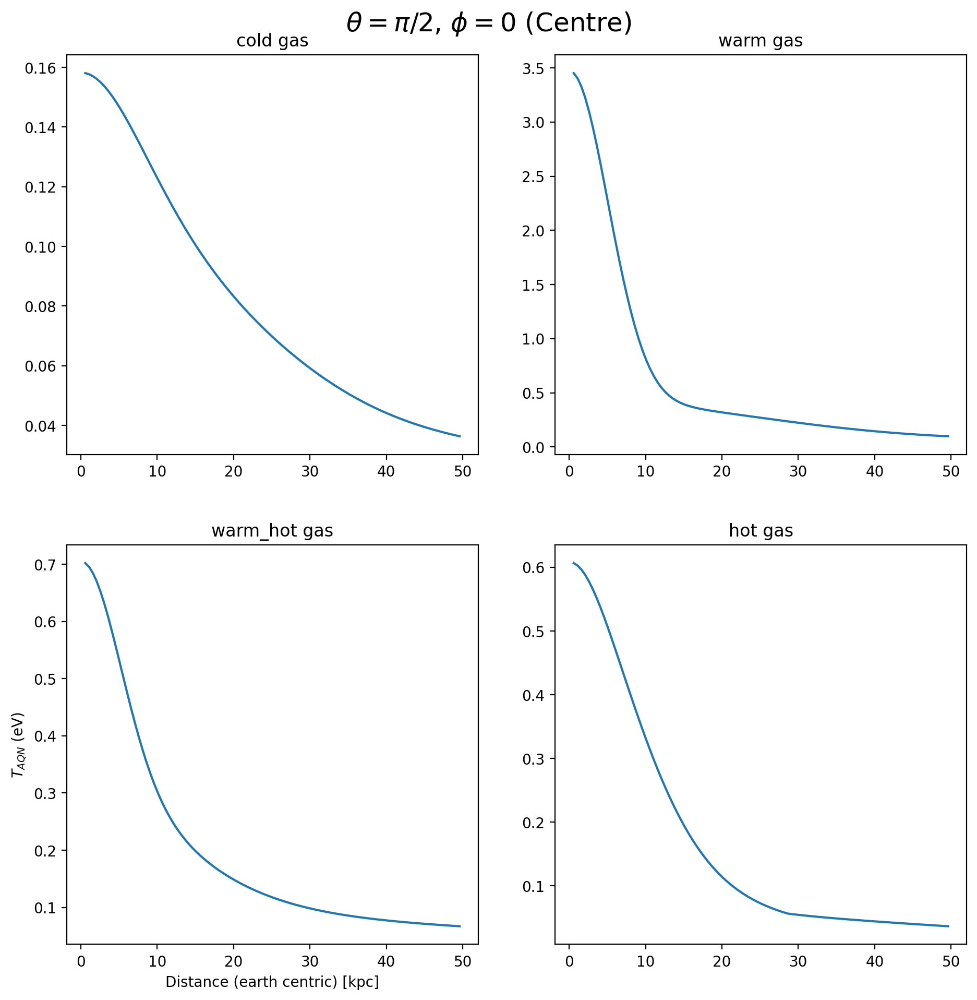

In [127]:
chosen_theta = np.pi
chosen_phi   = 0

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), dpi=200)

# Define the titles for each subplot
titles = ['cold', 'warm', 'warm_hot', 'hot']

# Loop through each subplot and add a plot with the given title
for i, ax in enumerate(axes.flat):
    ax.plot(l_array[:,pixel_index], T_aqn_dict_ev[titles[i]][:,pixel_index])
    ax.set_title(titles[i]+" gas")
    #ax.set_xlabel('Distance (earth centric) [kpc]')
    #ax.set_ylabel('$T_{AQN}$ (eV)')
axes[1][0].set_xlabel('Distance (earth centric) [kpc]')
axes[1][0].set_ylabel('$T_{AQN}$ (eV)')
# Adjust the layout and padding of the subplots
fig.tight_layout(pad=3.0)

fig.suptitle(r'$\theta = \pi/2$, $\phi = 0$ (Centre)', fontsize=18)

# Display the figure
plt.show()


In [115]:
len(l_array)

99

In [102]:
def calc_T_aqn(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
    T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
    T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
    T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
    ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
    T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
    #dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    #dF = np.sum(dFdw,2)
    return T_AQN


warm_T_aqn = calc_T_aqn( n_aqn_cm3, n_warm,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band)
warm_hot_T_aqn = calc_T_aqn( n_aqn_cm3, n_warm_hot, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band)
hot_T_aqn = calc_T_aqn( n_aqn_cm3, n_hot,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band)

<Quantity [10081.15962289,  9506.08046891,  9506.08046891, ...,
            9506.08046891,  9506.08046891, 10081.15962289] cm>

In [ ]:
# pick line of sight away from galactic centre, directly north
# look at T_AQN along this line of sight